<a href="https://colab.research.google.com/github/UFPE-ProjetoAM/AM-Questao01/blob/main/zer_KFCM_W_2_ipynb_Dataset_zer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install imgkit
!apt-get install -y wkhtmltopdf

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  avahi-daemon bind9-host bind9-libs geoclue-2.0 glib-networking glib-networking-common
  glib-networking-services gsettings-desktop-schemas iio-sensor-proxy libavahi-core7 libavahi-glib1
  libdaemon0 libevdev2 libfontenc1 libgudev-1.0-0 libhyphen0 libinput-bin libinput10
  libjson-glib-1.0-0 libjson-glib-1.0-common liblmdb0 libmaxminddb0 libmbim-glib4 libmbim-proxy
  libmd4c0 libmm-glib0 libmtdev1 libnl-genl-3-200 libnotify4 libnss-mdns libproxy1v5 libqmi-glib5
  libqmi-proxy libqt5core5a libqt5dbus5 libqt5gui5 libqt5network5 libqt5positioning5
  libqt5printsupport5 libqt5qml5 libqt5qmlmodels5 libqt5quick5 libqt5sensors5 libqt5svg5
  libqt5webchannel5 libqt5webkit5 libqt5widgets5 libsoup2.4-1 libsoup2.4-common libudev1
  libwacom-bin libwacom-common libwacom9 libwoff1 libxcb-icccm4 libxcb-image0 libxcb-keysyms1
  libxcb-render-util0 libx

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
from sklearn.metrics import adjusted_rand_score as ARI
from sklearn import datasets
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from google.colab import drive
from sklearn.metrics import confusion_matrix
import seaborn as sns
from matplotlib.pyplot import figure
from sklearn.metrics import (confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_curve, RocCurveDisplay, det_curve, auc)
from decimal import Decimal, getcontext
from matplotlib.colors import BoundaryNorm
import matplotlib.pyplot as plt
import imgkit
from IPython.display import Image

In [3]:
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
#Gabi
data = pd.read_csv('/content/drive/MyDrive/Datasets/mfeat-zer', header=None,delim_whitespace=True)
label= pd.read_csv('/content/drive/MyDrive/Datasets/label.csv', header=None,delim_whitespace=True)

In [13]:
#Dataset dos números

X1=data.to_numpy()
scaler = StandardScaler()
X = scaler.fit_transform(X1)

In [14]:
import numpy as np

class KFCM_K_W2:
    def __init__(self, data, c=10, m=1.1, max_iter=100, tol=1e-5):
        self.data = data
        self.c = c
        self.m = m
        self.n, self.p = data.shape
        self.U = np.zeros((self.c, self.n))
        self.g = np.zeros((self.c, self.p))
        self.s = np.ones((self.c, self.p))
        self.max_iter = max_iter
        self.tol = tol

    def gaussian_kernel(self, x, g, s):
        return np.exp(-0.5 * (np.sum((x - g)**2 * s, axis=1)))

    def initialize(self):
        self.U = np.random.rand(self.c, self.n)
        self.U /= self.U.sum(axis=0)
        idx = np.random.choice(self.n, self.c, replace=False)
        self.g = self.data[idx]
        return self.U, self.g
#Eq.15b
    def compute_prototypes(self):
        for i in range(self.c):
            kernel_values = self.gaussian_kernel(self.data, self.g[i], self.s[i])
            U_powered = self.U[i] ** self.m
            #Equação 8b
            self.g[i] = np.sum((U_powered * kernel_values)[:, None] * self.data, axis=0) / np.sum(U_powered * kernel_values)
        return self.g
#eq.14b
    def compute_widths(self):
      self.s = np.zeros((self.c, self.p), dtype=np.float64)
      for i in range(self.c):
          # Calcula o kernel para cada ponto de dados uma vez para evitar repetição
          kernel_values = self.gaussian_kernel(self.data, self.g[i], self.s[i])
          U_powered = self.U[i] ** self.m
          # Multiplica U_powered com kernel_values sem criar um array temporário grande
          U_powered_kernel = U_powered * kernel_values

          # Calcula o numerador e o denominador sem usar operações de potência ou produto
          for j in range(self.p):
              diffs_squared = (self.data[:, j] - self.g[i, j]) ** 2
              numerator = np.sum(U_powered_kernel * diffs_squared)
              denominator = np.sum(U_powered_kernel)
              self.s[i, j] = numerator / denominator

          # Aplica a transformação final em s[i] sem usar np.prod
          s_i_product = np.prod(self.s[i])
          self.s[i] = self.s[i] ** (1.0 / self.p) / s_i_product

      # Normaliza s para ter o produto dos elementos de cada linha igual a 1
      self.s = self.s / np.linalg.norm(self.s, ord=1, axis=1, keepdims=True)

      return self.s

#Eq.16
    def compute_JNew(self):
        J = 0
        for i in range(self.c):
            kernel_values = self.gaussian_kernel(self.data, self.g[i], self.s[i])
            J += np.sum((self.U[i]**self.m) * (2 - 2 * kernel_values))
        return J
#Eq.13
    def update_membership(self):
      epsilon = 1e-10
      for k in range(self.n):
          for i in range(self.c):
              kernel_values = self.gaussian_kernel(np.tile(self.data[k], (self.c, 1)), self.g, self.s)
              sum_denominator = np.sum((1 - kernel_values) / ((1 - kernel_values[i]) + epsilon), axis=0)
              self.U[i, k] = 1 / (sum_denominator ** (1 / (self.m - 1)))

      # Normalizar cada coluna de U para que a soma seja 1
      self.U /= np.sum(self.U, axis=0, keepdims=True)
      return self.U


    def fit(self):
        U, g = self.initialize()
        J_old = np.inf
        contador = 1
        for iter_count in range(self.max_iter):
            uik = self.update_membership()
            S = self.compute_widths()
            gi = self.compute_prototypes()
            J_new = self.compute_JNew()
            if abs(J_new - J_old) < self.tol:
                break
            J_old = J_new
            contador += 1

***********************
Épocas:  0
Função de custo:  1785.5201584406618
----------------
Parâmetros de Largura s:  [[0.02138558 0.02140204 0.02116896 0.02137642 0.02134496 0.02126981
  0.02143905 0.02140596 0.02135911 0.02129278 0.02111428 0.02122456
  0.02136713 0.0214069  0.02117862 0.02134918 0.02142477 0.02141155
  0.02108398 0.02136528 0.02131273 0.02116989 0.02111354 0.02134374
  0.02119008 0.02133439 0.02144074 0.02130664 0.02115339 0.0213255
  0.02120777 0.02104276 0.02126681 0.02132761 0.0214586  0.02129187
  0.02118528 0.021232   0.02105061 0.02116467 0.02147215 0.02125288
  0.02122876 0.02107229 0.02116545 0.02123261 0.02128633]
 [0.02138586 0.02140147 0.02116756 0.02137598 0.02134369 0.02126507
  0.02143777 0.02140731 0.02136004 0.02129786 0.0211203  0.02122317
  0.021364   0.02140642 0.02117695 0.02134844 0.02142268 0.02140625
  0.02107473 0.0213663  0.02131755 0.02117589 0.02111485 0.02134326
  0.02118833 0.02133339 0.02143851 0.02130111 0.02114461 0.02133016
  0.02121332

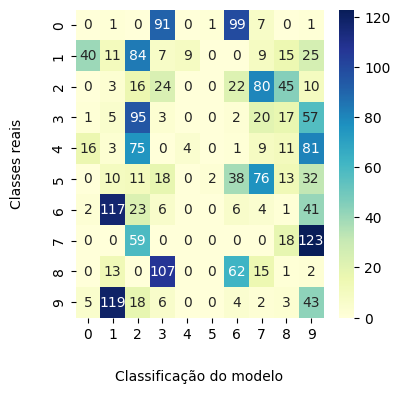

***********************
Épocas:  1
Função de custo:  1786.8516496968932
----------------
Parâmetros de Largura s:  [[0.02138443 0.0212899  0.0212312  0.02133034 0.02131914 0.02104075
  0.02127038 0.0213484  0.02133991 0.02141192 0.02125945 0.02120993
  0.02127025 0.02129251 0.02122637 0.0213038  0.02126687 0.02109141
  0.02089766 0.02134001 0.02141607 0.02127077 0.02132701 0.02130094
  0.02122903 0.02129129 0.0212654  0.02114198 0.02090095 0.02141955
  0.02127985 0.02141217 0.02126878 0.02128867 0.02129248 0.02128427
  0.02139324 0.02128703 0.02142451 0.02114963 0.02130959 0.02133203
  0.02138436 0.02142312 0.02114626 0.02134514 0.02129121]
 [0.02138601 0.02140245 0.02116502 0.02137595 0.02134284 0.02125865
  0.02143751 0.02140963 0.02136176 0.02130381 0.021126   0.02122177
  0.02136231 0.02140749 0.02117388 0.02134748 0.02142095 0.02139957
  0.02106509 0.02136809 0.02132326 0.02118158 0.02111531 0.02134399
  0.02118508 0.02133174 0.02143682 0.02129525 0.02113588 0.02133571
  0.0212185

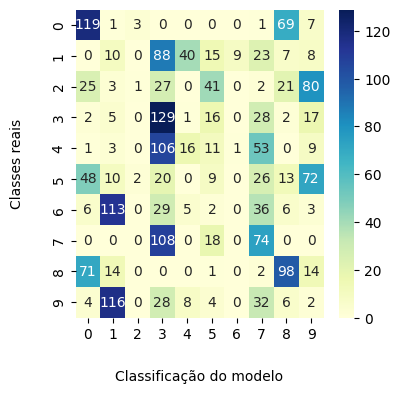

***********************
Épocas:  2
Função de custo:  1784.890064380101
----------------
Parâmetros de Largura s:  [[0.02106962 0.02111239 0.02110244 0.02116604 0.02139126 0.02136934
  0.02120505 0.02110884 0.02122987 0.021194   0.02132144 0.02149458
  0.02146809 0.02109338 0.02108982 0.02113461 0.02117662 0.02137884
  0.02140894 0.02120717 0.02115579 0.02130662 0.02144874 0.0213308
  0.02108133 0.02111387 0.02114646 0.02127667 0.0214012  0.0211295
  0.02130812 0.02151941 0.02139581 0.02109964 0.02112088 0.02127409
  0.0215401  0.02130933 0.02155163 0.02144797 0.02109888 0.02120913
  0.0214269  0.02155518 0.0214125  0.02117343 0.02144367]
 [0.0213795  0.02129923 0.02121264 0.02133392 0.02132341 0.02107833
  0.02130362 0.02135382 0.02134702 0.02141948 0.02127987 0.02121689
  0.02127039 0.02130184 0.02120397 0.02129547 0.02127332 0.02113846
  0.02089756 0.02134661 0.0214239  0.02129323 0.02129258 0.02129589
  0.02120469 0.02127576 0.02128008 0.0211511  0.02092745 0.02142715
  0.0212999  0

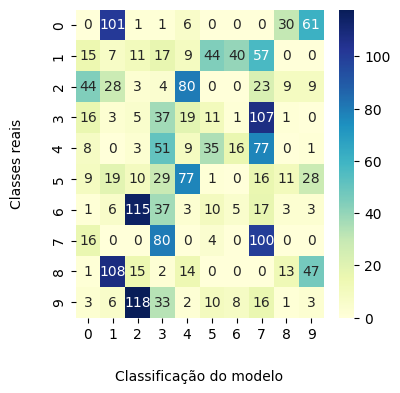

***********************
Épocas:  3
Função de custo:  1785.413324390836
----------------
Parâmetros de Largura s:  [[0.02138689 0.02140192 0.02116796 0.02137748 0.02134283 0.02126046
  0.0214374  0.02140863 0.02136087 0.02130122 0.02112345 0.02122238
  0.02136343 0.02140698 0.02117726 0.02134995 0.02142097 0.02140224
  0.02106963 0.02136723 0.02132076 0.021179   0.0211147  0.02134407
  0.02118862 0.02133475 0.02143674 0.02129663 0.02113944 0.02133326
  0.0212162  0.02104685 0.02126757 0.02132771 0.02145579 0.02128849
  0.02118791 0.02123989 0.02105504 0.02116494 0.02147033 0.02125296
  0.0212288  0.0210767  0.02116842 0.02123391 0.02128132]
 [0.0212139  0.02138962 0.02141466 0.02140728 0.02150024 0.02136864
  0.02144974 0.02114856 0.02119761 0.02091978 0.02086772 0.02128863
  0.02142294 0.02138003 0.02139982 0.02138423 0.02136126 0.02158329
  0.0218262  0.02118628 0.02092429 0.0208749  0.02115654 0.02127024
  0.02138585 0.0213661  0.02143661 0.02161819 0.02174145 0.02092678
  0.02090555

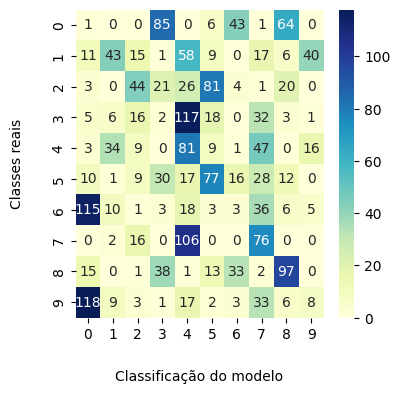

***********************
Épocas:  4
Função de custo:  1784.5910894771087
----------------
Parâmetros de Largura s:  [[0.02137592 0.02128078 0.02123165 0.02132219 0.0213168  0.02102074
  0.02126657 0.02134133 0.02132975 0.0214094  0.02127622 0.02121111
  0.02129988 0.02128286 0.02122957 0.02130472 0.02126198 0.02106785
  0.02090045 0.02133016 0.02141108 0.02128765 0.02132732 0.02131122
  0.02123359 0.02129639 0.02125322 0.02114551 0.0208984  0.0214125
  0.02129645 0.02141817 0.02127096 0.02129534 0.02127694 0.02127758
  0.0214147  0.02130306 0.02143142 0.02113892 0.0212926  0.02132205
  0.02139991 0.02142964 0.02114925 0.02133347 0.0213127 ]
 [0.02137768 0.02129433 0.02122006 0.02133604 0.0213224  0.0210647
  0.021297   0.02135059 0.02134206 0.02141787 0.02128205 0.02121555
  0.02127679 0.02129666 0.02121195 0.02130119 0.02126938 0.02112177
  0.0208969  0.02134169 0.02142133 0.02129421 0.02129897 0.02129828
  0.02121276 0.02128307 0.02127302 0.02114992 0.02092103 0.02142392
  0.02130051 

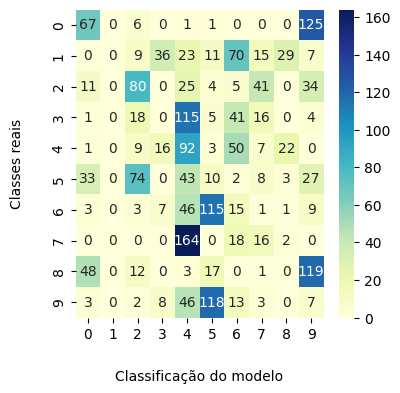

***********************
Épocas:  5
Função de custo:  1785.6281895457844
----------------
Parâmetros de Largura s:  [[0.02119193 0.02136386 0.02139783 0.02139342 0.02149863 0.02137465
  0.02144878 0.02112724 0.02118478 0.02092139 0.02091806 0.0213014
  0.02140165 0.02135398 0.0213811  0.02136786 0.0213348  0.02157531
  0.02183498 0.02117242 0.02092051 0.02091918 0.02119251 0.02125171
  0.02136592 0.0213483  0.02141227 0.02160358 0.02174733 0.02091946
  0.02094179 0.02109453 0.02122125 0.02133247 0.02142419 0.02137446
  0.0213089  0.0209595  0.02107675 0.02119201 0.0214147  0.02124691
  0.02137045 0.02107945 0.02111238 0.02121556 0.02140989]
 [0.02106502 0.02111054 0.02110096 0.02116545 0.02139189 0.02137108
  0.02120666 0.02110612 0.02122937 0.02119381 0.02132343 0.02149593
  0.02146829 0.0210912  0.02108773 0.02113314 0.02117738 0.02137949
  0.02141171 0.0212063  0.02115493 0.02130768 0.02145027 0.02133158
  0.02107879 0.02111173 0.02114712 0.02127914 0.02140325 0.0211281
  0.02130844 

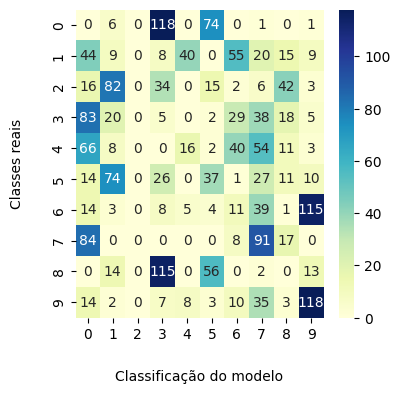

***********************
Épocas:  6
Função de custo:  1784.9662598539023
----------------
Parâmetros de Largura s:  [[0.02113482 0.02132497 0.02136257 0.02136487 0.02150354 0.02139414
  0.02146522 0.02108386 0.02116876 0.02092658 0.0209622  0.02134941
  0.02142263 0.02131186 0.02134109 0.02132902 0.02132015 0.02157978
  0.02184559 0.0211523  0.02091662 0.02094444 0.02123337 0.02127636
  0.0213227  0.0213042  0.02139648 0.02160907 0.02174981 0.0209089
  0.02095563 0.02112393 0.02125991 0.02128526 0.02140248 0.02138521
  0.02135645 0.02096647 0.02109689 0.02123635 0.02138849 0.02124809
  0.0213994  0.02109394 0.02115341 0.02120999 0.02143279]
 [0.02107201 0.02111339 0.02110312 0.02116634 0.02139031 0.02136863
  0.02120358 0.02111088 0.02123064 0.02119484 0.02132066 0.02149273
  0.02146705 0.02109452 0.02109077 0.02113537 0.0211766  0.02137749
  0.02140582 0.02120812 0.02115695 0.02130661 0.02144842 0.02133009
  0.02108249 0.02111496 0.02114616 0.02127568 0.02139835 0.0211309
  0.02130857 

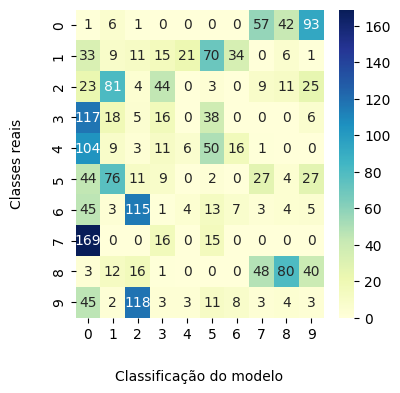

***********************
Épocas:  7
Função de custo:  1784.039245868675
----------------
Parâmetros de Largura s:  [[0.02106703 0.02111118 0.02110131 0.02116548 0.02139166 0.02137033
  0.02120608 0.02110697 0.02122927 0.02119371 0.02132248 0.02149563
  0.021469   0.02109201 0.02108838 0.02113361 0.02117694 0.02137962
  0.02141077 0.02120635 0.02115509 0.02130706 0.02144943 0.02133178
  0.02107967 0.02111255 0.02114699 0.02127834 0.02140276 0.02112848
  0.02130812 0.0215195  0.02139635 0.02109808 0.02112125 0.02127467
  0.02154061 0.02130906 0.02155148 0.02144882 0.02109909 0.02120935
  0.02142725 0.02155492 0.0214138  0.02117352 0.02144416]
 [0.02119331 0.02136706 0.02140064 0.02139606 0.02150046 0.02137462
  0.02145001 0.02112893 0.02118597 0.02092078 0.02090984 0.02130036
  0.02140588 0.02135706 0.02138392 0.02137033 0.02133837 0.02157825
  0.02183615 0.02117359 0.02092046 0.0209115  0.02118687 0.02125521
  0.02136871 0.02135064 0.02141599 0.02160731 0.02174815 0.02091975
  0.02093524

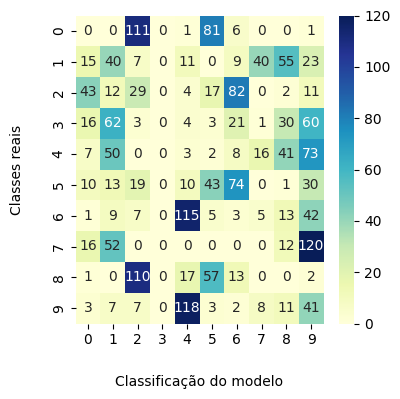

***********************
Épocas:  8
Função de custo:  1785.1554987966715
----------------
Parâmetros de Largura s:  [[0.02137798 0.02129762 0.02121487 0.02133621 0.02132358 0.02107328
  0.02130389 0.02135275 0.02134492 0.02141971 0.02128335 0.02121685
  0.02127552 0.02130004 0.02120609 0.02129854 0.02127171 0.02113321
  0.02089754 0.02134445 0.02142351 0.02129623 0.02129191 0.02129746
  0.02120664 0.02127885 0.02127735 0.02115195 0.02092696 0.02142628
  0.02130246 0.02135731 0.02128178 0.02127215 0.02131054 0.02129122
  0.02134316 0.02130676 0.02136914 0.02116185 0.02133192 0.0213392
  0.02134087 0.02137096 0.02117074 0.02135213 0.02124857]
 [0.02138703 0.02140231 0.02116766 0.02137802 0.02134272 0.02126031
  0.02143784 0.02140893 0.02136122 0.02130171 0.02112338 0.02122247
  0.02136436 0.02140735 0.02117679 0.02135019 0.02142125 0.02140267
  0.02106933 0.02136758 0.02132123 0.02117896 0.02111446 0.02134488
  0.02118806 0.02133479 0.02143713 0.02129642 0.02113937 0.0213337
  0.02121621 

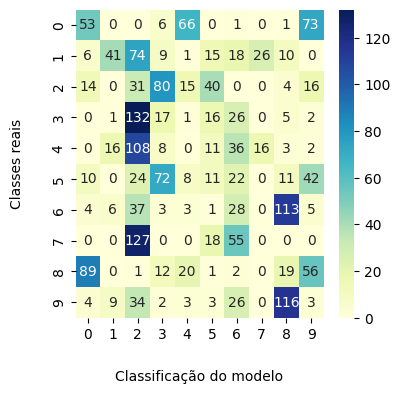

***********************
Épocas:  9
Função de custo:  1784.916257564862
----------------
Parâmetros de Largura s:  [[0.02107157 0.02111311 0.02110243 0.0211658  0.02139055 0.02136881
  0.02120369 0.02111031 0.02123072 0.02119496 0.02132051 0.02149295
  0.02146757 0.02109421 0.02109006 0.02113474 0.02117712 0.02137761
  0.02140571 0.02120815 0.021157   0.0213064  0.02144834 0.02133051
  0.02108178 0.02111428 0.02114652 0.02127623 0.02139819 0.0211309
  0.02130835 0.02152035 0.02139508 0.02110027 0.02112092 0.02127455
  0.02154085 0.02130983 0.0215528  0.02144599 0.021099   0.02120963
  0.02142756 0.02155636 0.0214102  0.02117387 0.02144368]
 [0.02137375 0.02128236 0.02123124 0.02132696 0.02131814 0.02102567
  0.0212753  0.02134166 0.0213295  0.02141188 0.0212852  0.02121233
  0.02130092 0.02128427 0.02122763 0.02130652 0.02126195 0.02107507
  0.02089886 0.02132979 0.02141316 0.02129608 0.02131868 0.02130961
  0.0212307  0.0212961  0.02125502 0.0211472  0.0209034  0.02141416
  0.02130333 

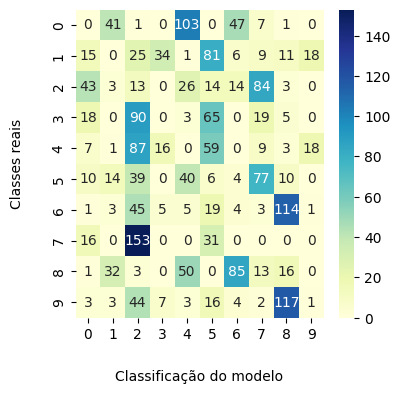

***********************
Épocas:  10
Função de custo:  1787.2481527737375
----------------
Parâmetros de Largura s:  [[0.0210602  0.02110888 0.02110015 0.02116518 0.02139432 0.02137159
  0.0212097  0.02110135 0.02122711 0.0211912  0.02132404 0.02150061
  0.02147182 0.02108926 0.02108642 0.02113196 0.02117695 0.02138316
  0.02141856 0.02120368 0.02115167 0.02130655 0.0214498  0.02133367
  0.02107708 0.02110989 0.02114748 0.02128107 0.02140997 0.02112435
  0.02130643 0.02151659 0.02139926 0.02109467 0.02112142 0.02127593
  0.02154057 0.02130669 0.02154815 0.02145458 0.02109894 0.02120985
  0.02142758 0.02155158 0.02142013 0.02117363 0.02144632]
 [0.02138608 0.02130126 0.02121109 0.0213281  0.02132418 0.02108616
  0.02129453 0.02135592 0.02135217 0.02141966 0.0212659  0.02121677
  0.02125537 0.0213042  0.02120281 0.02128862 0.02127533 0.02114379
  0.02089824 0.02135171 0.02142546 0.02127918 0.02130267 0.0212923
  0.02120402 0.02126967 0.02128352 0.02114595 0.02092444 0.02142993
  0.0212873

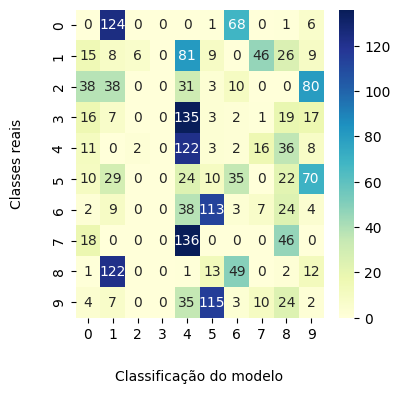

***********************
Épocas:  11
Função de custo:  1785.3829756790137
----------------
Parâmetros de Largura s:  [[0.02120997 0.02137161 0.02140434 0.02140011 0.02149748 0.02136511
  0.02144222 0.02114212 0.02118849 0.02092373 0.02091388 0.02128471
  0.02139197 0.02136278 0.02138915 0.02137793 0.02133322 0.02157
  0.02183195 0.02117743 0.02092536 0.02092157 0.02118213 0.02124157
  0.02137509 0.02136023 0.02141184 0.02159647 0.02174758 0.02092627
  0.02094723 0.02109183 0.02120804 0.02134557 0.02142655 0.02136592
  0.02129384 0.02096654 0.02107843 0.02118372 0.02141881 0.02124283
  0.02135867 0.0210833  0.02110975 0.02121448 0.02139817]
 [0.02138269 0.02129223 0.02122893 0.02133325 0.0213195  0.02105199
  0.02127885 0.02134935 0.02134037 0.02141306 0.02126702 0.0212113
  0.02126927 0.0212949  0.02122312 0.02130412 0.02126765 0.02110502
  0.02089594 0.02134042 0.02141717 0.02127873 0.02131706 0.0212979
  0.02122519 0.02128989 0.021269   0.02114371 0.02090664 0.02142049
  0.02128679 0.

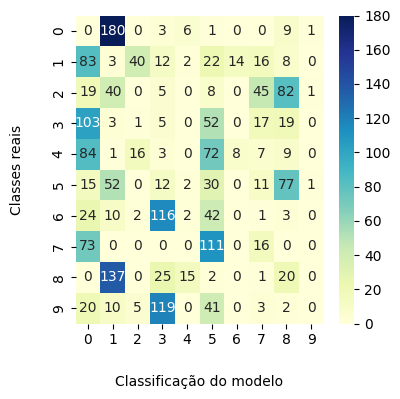

***********************
Épocas:  12
Função de custo:  1785.3305068247205
----------------
Parâmetros de Largura s:  [[0.02106861 0.02111181 0.0211015  0.02116535 0.02139142 0.02136954
  0.02120521 0.02110806 0.02122987 0.02119426 0.02132162 0.02149486
  0.02146879 0.02109272 0.0210888  0.02113378 0.02117715 0.02137883
  0.0214089  0.02120707 0.0211559  0.02130665 0.02144878 0.02133149
  0.02108026 0.02111294 0.02114683 0.02127753 0.02140102 0.02112948
  0.02130806 0.02151953 0.02139619 0.02109864 0.02112109 0.02127501
  0.02154092 0.02130921 0.02155173 0.02144801 0.021099   0.02120981
  0.02142764 0.02155523 0.02141263 0.02117391 0.02144436]
 [0.02137949 0.02129996 0.02121179 0.02133385 0.02132351 0.02107989
  0.02130495 0.02135415 0.02134755 0.02141963 0.02128002 0.02121706
  0.02127018 0.0213026  0.02120305 0.02129501 0.02127379 0.02114061
  0.02089759 0.02134714 0.02142413 0.02129357 0.0212911  0.0212957
  0.02120376 0.02127508 0.0212809  0.02115153 0.02092844 0.02142743
  0.0213002

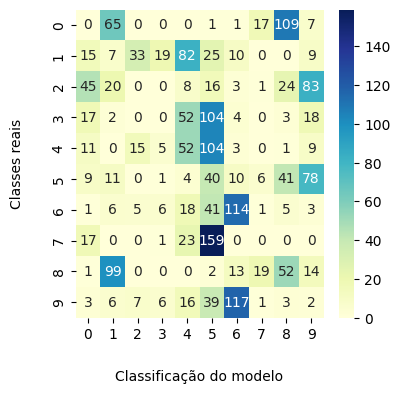

***********************
Épocas:  13
Função de custo:  1786.1210919686112
----------------
Parâmetros de Largura s:  [[0.02137291 0.02128691 0.02122797 0.0213353  0.02132077 0.02104027
  0.02128991 0.02134489 0.02133295 0.02141621 0.02129199 0.02121422
  0.02129597 0.02128872 0.02122149 0.02130775 0.02126351 0.02109395
  0.0208973  0.02133288 0.02141768 0.02130274 0.02130478 0.02130549
  0.02122293 0.02129292 0.02126102 0.02115034 0.02091366 0.02141869
  0.02130838 0.02138073 0.02127802 0.0212881  0.02129034 0.02128165
  0.02137928 0.02131234 0.02139255 0.02114439 0.0213097  0.02132788
  0.02136906 0.02139247 0.02116009 0.0213401  0.02127881]
 [0.02107152 0.02111342 0.02110281 0.02116618 0.02139043 0.0213686
  0.02120319 0.02111043 0.02123079 0.021195   0.02132    0.0214924
  0.02146749 0.02109451 0.02109039 0.0211351  0.02117754 0.02137737
  0.02140447 0.02120821 0.021157   0.02130599 0.02144798 0.02133058
  0.02108206 0.02111457 0.02114667 0.02127653 0.02139711 0.02113087
  0.02130805

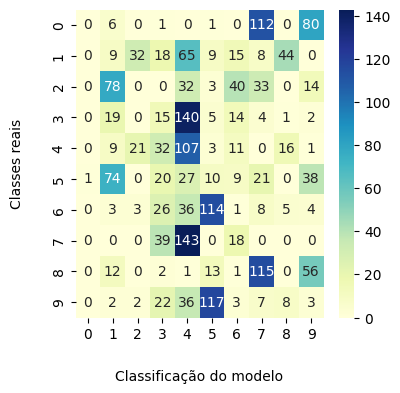

***********************
Épocas:  14
Função de custo:  1786.0713783235742
----------------
Parâmetros de Largura s:  [[0.02111182 0.0213181  0.02135423 0.0213557  0.02150587 0.02140284
  0.02147385 0.02106828 0.02116709 0.02092821 0.02096175 0.0213693
  0.02144385 0.02130316 0.02133057 0.02131537 0.0213273  0.02158652
  0.02184873 0.02114864 0.02091558 0.02093511 0.02123724 0.02129824
  0.02131063 0.02128824 0.02140091 0.02161946 0.02174895 0.02090564
  0.02094317 0.02111502 0.02128142 0.02126793 0.02140318 0.02139765
  0.02136628 0.02095271 0.02108306 0.02124942 0.02138707 0.02125724
  0.02140991 0.0210782  0.02116095 0.0212159  0.02144973]
 [0.02138601 0.02140272 0.02116802 0.02137625 0.02134432 0.02126679
  0.02143834 0.02140717 0.02135973 0.02129536 0.02111704 0.02122327
  0.02136502 0.02140766 0.02117753 0.02134876 0.02142403 0.02140789
  0.02107924 0.02136598 0.02131524 0.02117283 0.02111373 0.02134294
  0.02118896 0.02133379 0.02144019 0.0213037  0.02114897 0.02132799
  0.0212105

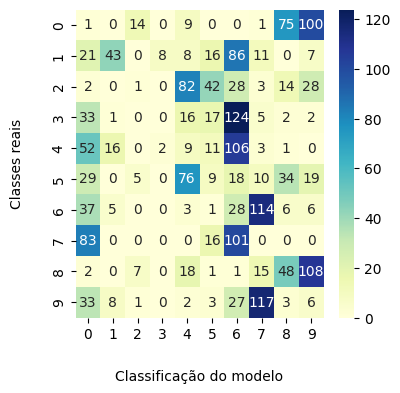

***********************
Épocas:  15
Função de custo:  1785.1832977576028
----------------
Parâmetros de Largura s:  [[0.02138662 0.02140216 0.02116819 0.02137741 0.02134364 0.02126281
  0.0214385  0.0214081  0.02136072 0.02129926 0.02112088 0.02122342
  0.02136524 0.02140715 0.02117751 0.02134991 0.02142216 0.02140521
  0.0210731  0.02136702 0.0213189  0.02117645 0.0211142  0.02134462
  0.02118886 0.02133477 0.02143782 0.02129879 0.02114285 0.02133146
  0.02121385 0.02104508 0.02126795 0.02132776 0.02145656 0.02128874
  0.02118699 0.02123769 0.02105308 0.02116498 0.02147087 0.0212523
  0.02122857 0.02107476 0.02116749 0.02123296 0.02128266]
 [0.02138672 0.02140185 0.02116746 0.02137714 0.021343   0.02126037
  0.02143783 0.02140875 0.02136116 0.02130181 0.02112393 0.0212227
  0.02136364 0.02140689 0.02117664 0.02134947 0.02142106 0.02140247
  0.0210685  0.0213675  0.02132133 0.02117949 0.0211149  0.02134436
  0.02118795 0.0213342  0.02143667 0.02129608 0.02113847 0.02133381
  0.02121665

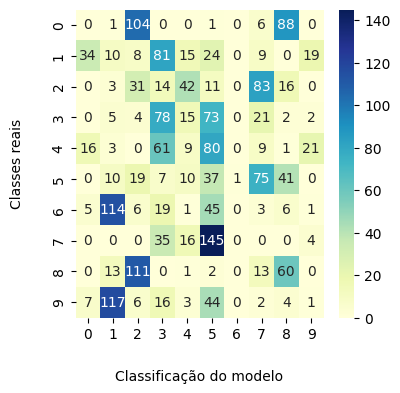

***********************
Épocas:  16
Função de custo:  1785.053946545189
----------------
Parâmetros de Largura s:  [[0.02138742 0.02140193 0.02116872 0.02137839 0.02134243 0.02125995
  0.02143709 0.02140879 0.02136084 0.02130149 0.02112346 0.02122204
  0.02136359 0.02140703 0.02117807 0.02135098 0.02142061 0.02140195
  0.02106991 0.02136723 0.02132102 0.02117905 0.02111435 0.02134432
  0.02118945 0.02133582 0.02143647 0.02129624 0.0211396  0.0213335
  0.0212163  0.02104638 0.02126774 0.02132878 0.02145559 0.02128779
  0.02118791 0.02124    0.02105444 0.02116459 0.02147019 0.02125212
  0.02122851 0.02107607 0.02116783 0.02123307 0.02128092]
 [0.02107066 0.02111301 0.02110314 0.02116657 0.02139069 0.02136898
  0.02120421 0.02110991 0.02123011 0.02119427 0.02132107 0.02149354
  0.02146748 0.02109405 0.02109061 0.02113533 0.02117645 0.02137823
  0.02140727 0.02120749 0.02115618 0.02130662 0.02144856 0.02133041
  0.02108218 0.02111471 0.0211462  0.02127624 0.02139977 0.02112998
  0.02130834

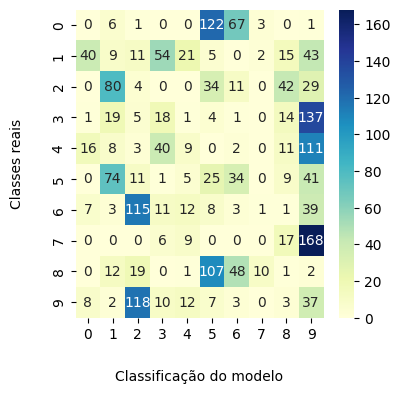

***********************
Épocas:  17
Função de custo:  1785.2054465593365
----------------
Parâmetros de Largura s:  [[0.02107419 0.02111425 0.02110294 0.02116589 0.02138977 0.02136813
  0.02120214 0.02111217 0.02123156 0.02119564 0.02131902 0.02149101
  0.0214667  0.02109553 0.02109089 0.02113535 0.02117767 0.02137625
  0.02140217 0.02120917 0.021158   0.02130575 0.02144782 0.02132995
  0.02108284 0.02111526 0.02114658 0.02127562 0.02139495 0.02113216
  0.02130827 0.02152139 0.02139403 0.02110152 0.02112099 0.02127481
  0.02154161 0.02131009 0.02155413 0.02144363 0.02109916 0.0212099
  0.02142828 0.02155773 0.0214074  0.02117408 0.02144357]
 [0.0213806  0.02129872 0.02121496 0.02133326 0.02132309 0.02107687
  0.02129942 0.02135341 0.0213469  0.02141845 0.0212765  0.02121625
  0.02126759 0.02130138 0.02120659 0.0212957  0.02127292 0.02113554
  0.0208971  0.02134653 0.02142303 0.02128958 0.02129693 0.02129506
  0.02120746 0.0212767  0.02127934 0.02114934 0.02092441 0.02142649
  0.0212965

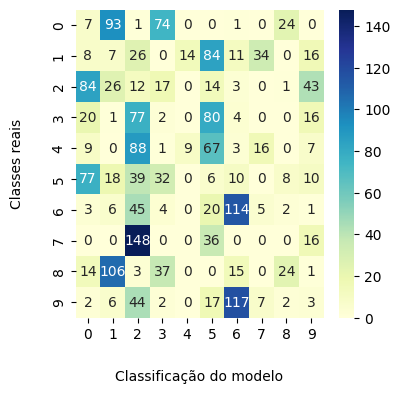

***********************
Épocas:  18
Função de custo:  1785.6381984618781
----------------
Parâmetros de Largura s:  [[0.02138087 0.02130067 0.02121087 0.02133233 0.0213238  0.0210828
  0.02130346 0.02135476 0.02134897 0.02141972 0.02127696 0.02121721
  0.02126669 0.0213034  0.02120217 0.02129299 0.02127458 0.02114317
  0.02089782 0.02134853 0.02142456 0.02129058 0.02129269 0.02129479
  0.02120296 0.0212731  0.02128219 0.02115064 0.02092825 0.02142816
  0.02129759 0.02135713 0.02128091 0.02126675 0.02131578 0.02129358
  0.02133776 0.02130254 0.02136905 0.02116773 0.02133717 0.02134207
  0.02133792 0.02137106 0.02117276 0.02135524 0.02124528]
 [0.02106629 0.02111096 0.02110068 0.02116497 0.02139216 0.02137016
  0.02120613 0.0211061  0.02122931 0.02119374 0.02132201 0.02149615
  0.02147    0.02109172 0.0210877  0.02113294 0.02117759 0.02137989
  0.02141054 0.02120631 0.02115503 0.02130645 0.02144886 0.02133243
  0.02107896 0.02111176 0.0211473  0.02127892 0.02140255 0.02112835
  0.0213075

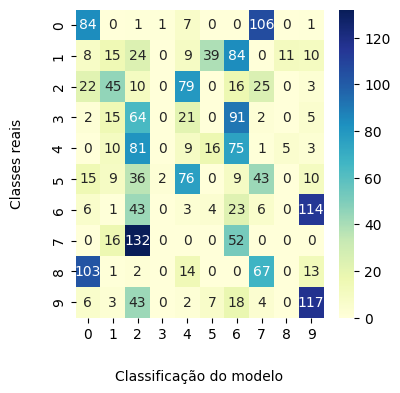

***********************
Épocas:  19
Função de custo:  1790.282028266527
----------------
Parâmetros de Largura s:  [[0.02138506 0.02140449 0.02116162 0.02137581 0.02134261 0.02125045
  0.02143816 0.02141228 0.02136374 0.02130989 0.02113083 0.02122021
  0.0213616  0.02140963 0.02116979 0.02134571 0.02141909 0.02139027
  0.02105626 0.02137005 0.0213291  0.02118619 0.02111504 0.02134528
  0.02118071 0.0213288  0.02143516 0.02129046 0.02112832 0.02134138
  0.02122259 0.02104873 0.02127229 0.02132087 0.02145561 0.02129106
  0.02118743 0.02124576 0.02105791 0.02117137 0.02147132 0.02126051
  0.02122479 0.0210802  0.02117663 0.02124303 0.02127191]
 [0.02121904 0.02139482 0.02141621 0.02140522 0.02148989 0.02136979
  0.02144601 0.02114959 0.02120032 0.02091658 0.02086633 0.02128989
  0.02142119 0.02138584 0.02140225 0.02138395 0.02136852 0.02157524
  0.021812   0.02118942 0.02092167 0.02087223 0.02115809 0.02127087
  0.02138887 0.02136684 0.02144054 0.02161269 0.02173115 0.02092455
  0.0209022

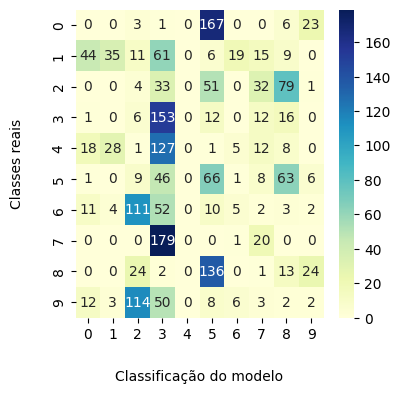

***********************
Épocas:  20
Função de custo:  1784.6848600393398
----------------
Parâmetros de Largura s:  [[0.02138656 0.02140197 0.02116792 0.02137697 0.0213434  0.02126385
  0.02143782 0.02140793 0.02136037 0.0212987  0.02112076 0.02122294
  0.02136427 0.02140697 0.02117729 0.02134944 0.02142242 0.0214056
  0.02107358 0.02136669 0.02131838 0.02117644 0.02111448 0.02134374
  0.02118867 0.02133435 0.02143833 0.0212998  0.0211434  0.02133098
  0.02121391 0.02104583 0.02126691 0.02132739 0.02145698 0.02128955
  0.02118713 0.02123778 0.02105393 0.02116453 0.02147119 0.02125287
  0.02122876 0.02107557 0.02116731 0.02123341 0.02128294]
 [0.0213804  0.02130067 0.02121067 0.02133244 0.02132344 0.0210831
  0.02130417 0.02135473 0.02134848 0.02141934 0.02127796 0.02121708
  0.02126743 0.0213034  0.02120205 0.02129332 0.0212746  0.02114389
  0.02089773 0.02134808 0.02142414 0.02129172 0.02129182 0.02129485
  0.02120289 0.02127349 0.02128232 0.02115101 0.02092854 0.02142769
  0.02129868

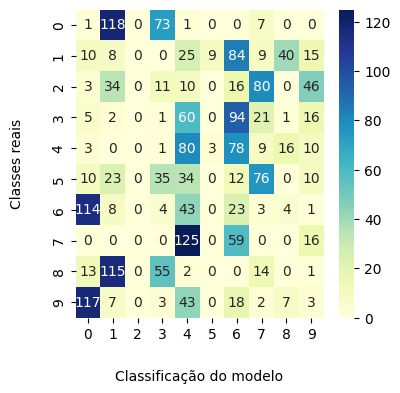

***********************
Épocas:  21
Função de custo:  1786.804488738723
----------------
Parâmetros de Largura s:  [[0.0212148  0.0213908  0.02141495 0.02140641 0.02149869 0.02136838
  0.02144934 0.02114875 0.02119815 0.02091892 0.02086762 0.02128838
  0.02142255 0.02138131 0.02140022 0.02138371 0.02136256 0.02158202
  0.02182445 0.0211869  0.02092353 0.02087462 0.02115685 0.02127022
  0.02138632 0.02136582 0.02143738 0.02161708 0.02174039 0.02092611
  0.0209051  0.02104676 0.0212238  0.02135108 0.02144934 0.02138673
  0.02126906 0.02092853 0.02103058 0.0211728  0.02144109 0.02126447
  0.02135243 0.02103654 0.02108527 0.02123423 0.02141494]
 [0.02138517 0.02129387 0.02122569 0.02133194 0.02132115 0.02105708
  0.021279   0.02135096 0.02134425 0.0214152  0.02126217 0.02121212
  0.02126273 0.02129658 0.02121913 0.02130001 0.02126943 0.02110986
  0.0208969  0.02134409 0.02141992 0.02127374 0.02131887 0.02129669
  0.02122094 0.02128468 0.02127186 0.02114258 0.02090883 0.02142376
  0.0212820

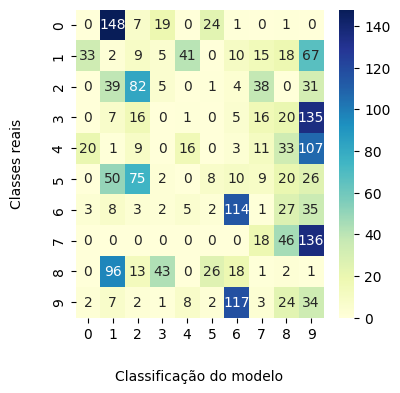

***********************
Épocas:  22
Função de custo:  1784.8950290936189
----------------
Parâmetros de Largura s:  [[0.02138739 0.02140183 0.02116873 0.02137805 0.0213426  0.02126004
  0.02143739 0.02140868 0.02136093 0.02130158 0.02112364 0.02122237
  0.02136348 0.02140691 0.02117805 0.02135071 0.02142072 0.02140233
  0.02106925 0.02136732 0.02132111 0.02117924 0.02111461 0.02134419
  0.02118941 0.0213356  0.02143641 0.02129573 0.02113883 0.02133359
  0.02121648 0.02104673 0.02126741 0.02132859 0.0214555  0.02128746
  0.02118825 0.02124017 0.02105479 0.02116434 0.02147009 0.02125187
  0.02122908 0.02107638 0.02116782 0.02123284 0.02128148]
 [0.0212383  0.02139538 0.02141439 0.02140738 0.02149093 0.02135831
  0.02143675 0.02116867 0.02120203 0.02092516 0.02087621 0.02126798
  0.02140361 0.02138764 0.02140225 0.02138999 0.02135842 0.02156705
  0.02181428 0.02119268 0.02093266 0.02089198 0.02115176 0.02125194
  0.02139035 0.0213754  0.02143333 0.02160384 0.02173621 0.02093756
  0.020925

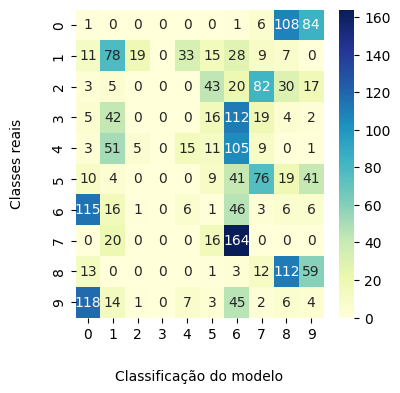

***********************
Épocas:  23
Função de custo:  1784.8875634869821
----------------
Parâmetros de Largura s:  [[0.02121987 0.02137596 0.02140658 0.02140143 0.02149248 0.02136189
  0.02143696 0.02115027 0.02119142 0.02092479 0.02091303 0.02127771
  0.02138596 0.02136785 0.02139251 0.02138154 0.02133477 0.02156446
  0.02182522 0.02118114 0.02092783 0.02092372 0.02117942 0.02123587
  0.02137926 0.02136518 0.02141243 0.02159218 0.02174353 0.0209298
  0.02095067 0.02109259 0.02120178 0.02135136 0.0214277  0.02136271
  0.02128729 0.02097065 0.02108088 0.02118004 0.02142065 0.02124251
  0.02135306 0.02108656 0.02110843 0.02121544 0.02139262]
 [0.02107336 0.021114   0.02110312 0.02116621 0.02138984 0.0213685
  0.02120261 0.0211119  0.0212314  0.02119556 0.02131991 0.02149138
  0.02146639 0.02109521 0.02109092 0.02113543 0.02117724 0.02137661
  0.02140331 0.02120898 0.02115784 0.0213064  0.02144823 0.02132971
  0.02108276 0.02111517 0.02114637 0.0212755  0.02139599 0.02113193
  0.0213087 

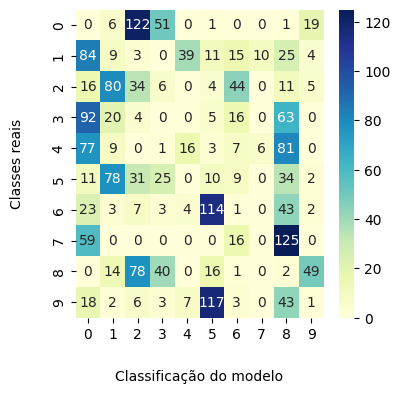

***********************
Épocas:  24
Função de custo:  1788.2153777543379
----------------
Parâmetros de Largura s:  [[0.02137919 0.02129658 0.02121786 0.02133611 0.02132402 0.02106921
  0.02129913 0.0213521  0.02134505 0.0214196  0.0212797  0.02121646
  0.0212738  0.02129899 0.02120915 0.02129908 0.0212709  0.02112702
  0.02089738 0.02134456 0.02142343 0.02129196 0.02129698 0.02129743
  0.0212097  0.02127988 0.02127556 0.02115028 0.02092359 0.02142631
  0.0212984  0.02136512 0.02128107 0.02127352 0.02130807 0.02128977
  0.02134959 0.02130305 0.02137692 0.02115997 0.02132896 0.02133801
  0.02134683 0.02137822 0.02116651 0.02135119 0.0212538 ]
 [0.02106316 0.02110991 0.02109951 0.02116436 0.02139235 0.02137184
  0.02120691 0.02110437 0.02122933 0.02119374 0.02132271 0.02149629
  0.02146955 0.02109046 0.02108611 0.02113184 0.02117901 0.02137956
  0.0214115  0.02120604 0.02115446 0.02130672 0.02145018 0.02133287
  0.02107705 0.02111022 0.02114817 0.02128149 0.02140287 0.02112732
  0.021307

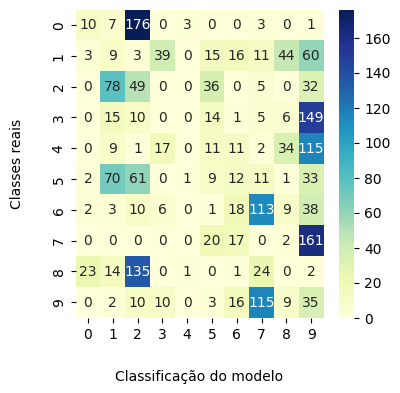

***********************
Épocas:  25
Função de custo:  1785.1210623519428
----------------
Parâmetros de Largura s:  [[0.02107205 0.02111342 0.02110274 0.02116608 0.02139027 0.02136854
  0.02120315 0.02111077 0.02123084 0.02119511 0.02131995 0.02149222
  0.02146746 0.02109455 0.02109041 0.02113515 0.0211775  0.02137718
  0.02140436 0.02120829 0.02115717 0.02130603 0.021448   0.02133057
  0.02108214 0.02111475 0.0211467  0.02127638 0.02139696 0.0211311
  0.02130813 0.02152061 0.02139476 0.02110076 0.02112108 0.02127496
  0.02154113 0.0213097  0.02155319 0.02144507 0.02109916 0.02120993
  0.02142786 0.02155676 0.02140931 0.02117406 0.02144369]
 [0.02137417 0.02128582 0.02122974 0.0213333  0.02131991 0.02103686
  0.02128397 0.02134435 0.02133244 0.0214144  0.02128722 0.02121324
  0.02129448 0.02128774 0.02122412 0.02130767 0.02126328 0.02108903
  0.02089748 0.02133246 0.02141607 0.02129803 0.02131058 0.02130567
  0.02122605 0.02129416 0.02125985 0.02114851 0.02090948 0.02141732
  0.0213043

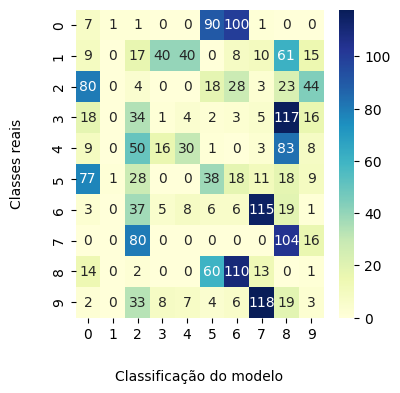

***********************
Épocas:  26
Função de custo:  1786.2154552511365
----------------
Parâmetros de Largura s:  [[0.02137966 0.02128428 0.02123255 0.02132573 0.02131783 0.02102543
  0.02126678 0.0213441  0.02133386 0.02141002 0.02126744 0.02121009
  0.02128787 0.02128657 0.02122944 0.02130491 0.02126406 0.02107396
  0.02089966 0.02133414 0.02141274 0.0212788  0.021329   0.02130768
  0.02123293 0.02129506 0.02125766 0.02114387 0.02089796 0.02141508
  0.02128791 0.02141867 0.02126977 0.02129345 0.02128232 0.02128011
  0.02140871 0.02129495 0.0214316  0.0211424  0.02129832 0.02132608
  0.02139598 0.0214298  0.02114617 0.02133827 0.02130633]
 [0.02114033 0.02133414 0.0213711  0.02136983 0.02150289 0.02139315
  0.02146486 0.02108801 0.02117252 0.02092406 0.02094861 0.02134477
  0.02142559 0.02132119 0.02134992 0.02133478 0.0213278  0.0215827
  0.02184417 0.02115638 0.02091535 0.02093174 0.02122382 0.02127855
  0.02133165 0.02131025 0.02140326 0.02161245 0.02174902 0.02090845
  0.0209444

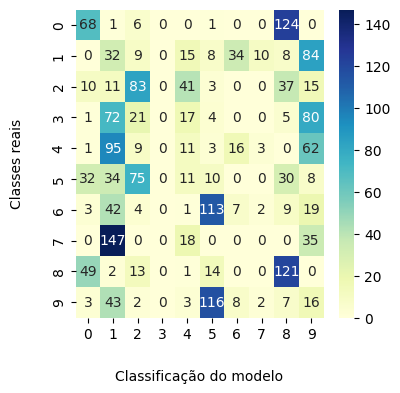

***********************
Épocas:  27
Função de custo:  1784.3389363826657
----------------
Parâmetros de Largura s:  [[0.02137945 0.02129698 0.02121732 0.02133532 0.02132291 0.02107259
  0.02129854 0.02135225 0.02134481 0.02141843 0.02127897 0.02121592
  0.02127157 0.02129951 0.02120898 0.02129874 0.02127134 0.02113113
  0.02089704 0.02134437 0.02142248 0.0212916  0.02129702 0.02129645
  0.02120977 0.02127993 0.02127675 0.0211497  0.02092318 0.02142552
  0.02129822 0.02136497 0.02127916 0.02127383 0.02130931 0.02129062
  0.02134844 0.02130295 0.02137687 0.02116157 0.02133011 0.02133873
  0.02134577 0.02137825 0.02116782 0.02135179 0.02125301]
 [0.02121477 0.02137488 0.02140565 0.0214006  0.0214942  0.0213651
  0.02143978 0.02114604 0.02119054 0.02092342 0.02091033 0.02128222
  0.02139104 0.02136638 0.02139107 0.02137951 0.02133708 0.02156794
  0.02182749 0.02117983 0.02092592 0.02091925 0.0211799  0.02124071
  0.02137745 0.02136248 0.02141461 0.02159658 0.02174443 0.02092742
  0.0209457

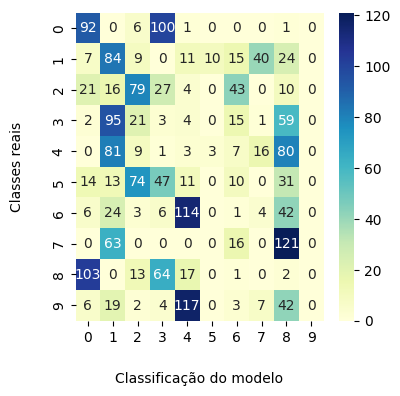

***********************
Épocas:  28
Função de custo:  1784.8800367565586
----------------
Parâmetros de Largura s:  [[0.02111537 0.02131651 0.02135321 0.02135565 0.02150417 0.02140094
  0.02147111 0.02107045 0.0211664  0.02092898 0.02096823 0.02136617
  0.02143744 0.02130201 0.02132999 0.02131613 0.02132299 0.02158313
  0.02184687 0.02114836 0.02091648 0.02094317 0.02124038 0.02129221
  0.02131039 0.02128944 0.02139711 0.02161481 0.02174835 0.02090673
  0.02095111 0.02112271 0.02127692 0.02126941 0.02140014 0.0213929
  0.02136708 0.02096032 0.02109197 0.02124956 0.02138443 0.02125335
  0.02140824 0.02108734 0.02116358 0.02121283 0.02144491]
 [0.02137835 0.02129042 0.02122634 0.02133438 0.02132098 0.02105169
  0.02128583 0.02134813 0.0213388  0.02141518 0.02127739 0.02121351
  0.02127866 0.02129268 0.02121954 0.02130387 0.02126691 0.02110507
  0.0208968  0.02133859 0.02141835 0.02128882 0.02131018 0.02130021
  0.02122099 0.02128829 0.0212675  0.02114709 0.02091208 0.02142083
  0.0212957

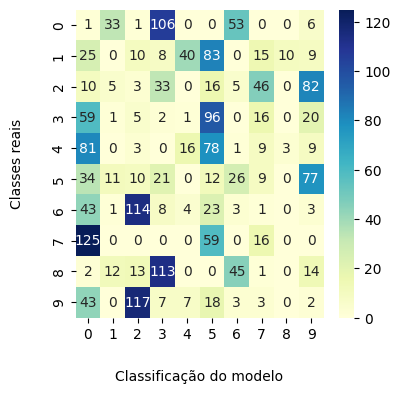

***********************
Épocas:  29
Função de custo:  1786.3408400682363
----------------
Parâmetros de Largura s:  [[0.02105797 0.0211072  0.02109707 0.02116303 0.02139377 0.02137276
  0.02120957 0.02110024 0.02122784 0.02119321 0.02132523 0.02149999
  0.0214732  0.02108738 0.02108314 0.02112964 0.02117855 0.02138213
  0.02141663 0.02120413 0.02115328 0.02130768 0.02145038 0.02133547
  0.02107372 0.02110739 0.02114856 0.02128347 0.02140756 0.02112562
  0.02130741 0.02151828 0.02139942 0.02109204 0.02112212 0.02127798
  0.02154282 0.02130753 0.02154975 0.02145282 0.02109937 0.02121136
  0.02142925 0.02155296 0.02141894 0.02117477 0.02144738]
 [0.02123794 0.02138564 0.02140949 0.02140355 0.02148648 0.02135613
  0.02142918 0.02116593 0.02119746 0.02092711 0.02090456 0.0212643
  0.02138122 0.02137855 0.02139741 0.02138754 0.02134225 0.02155702
  0.0218156  0.02118844 0.02093317 0.02092084 0.02116871 0.02123186
  0.02138563 0.02137361 0.02141824 0.02158829 0.02173788 0.02093731
  0.0209509

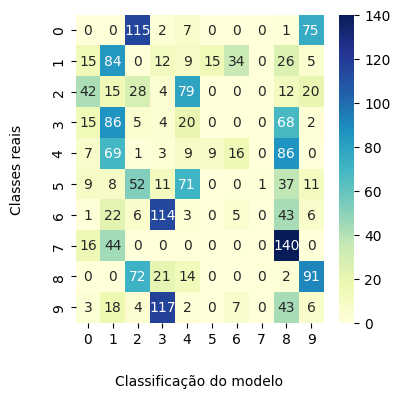

***********************
Épocas:  30
Função de custo:  1785.3761057654203
----------------
Parâmetros de Largura s:  [[0.02107108 0.02111262 0.02110093 0.02116458 0.02139073 0.02136873
  0.02120343 0.02110932 0.02123079 0.0211953  0.02131962 0.02149303
  0.02146937 0.0210937  0.0210886  0.02113362 0.02117844 0.02137753
  0.02140426 0.02120809 0.02115717 0.02130547 0.0214476  0.02133197
  0.02108037 0.02111318 0.02114742 0.02127774 0.02139679 0.02113096
  0.02130754 0.02152031 0.02139578 0.02109918 0.02112155 0.02127682
  0.02154255 0.0213091  0.02155296 0.02144522 0.0210995  0.0212113
  0.02142946 0.0215565  0.02140943 0.02117505 0.0214453 ]
 [0.02107305 0.02111346 0.02110139 0.02116475 0.02138994 0.02136822
  0.02120221 0.02111096 0.02123151 0.02119605 0.02131886 0.02149138
  0.02146846 0.02109466 0.02108929 0.02113416 0.02117868 0.02137633
  0.02140149 0.02120896 0.02115818 0.02130537 0.02144733 0.0213314
  0.02108123 0.02111399 0.02114734 0.0212771  0.02139422 0.02113217
  0.02130784

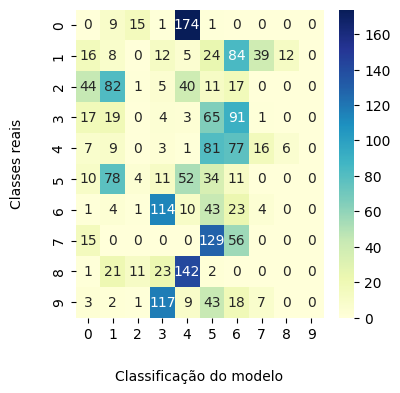

***********************
Épocas:  31
Função de custo:  1784.7483940762454
----------------
Parâmetros de Largura s:  [[0.02137742 0.02128435 0.02123185 0.02132803 0.02131807 0.02102958
  0.02127205 0.02134389 0.02133267 0.02141096 0.02127502 0.02121112
  0.02129051 0.02128652 0.02122805 0.02130604 0.02126351 0.02107899
  0.02089846 0.02133291 0.02141327 0.02128628 0.02132289 0.02130669
  0.02123109 0.0212952  0.02125821 0.02114534 0.02090125 0.02141519
  0.02129443 0.02140938 0.02127109 0.02129289 0.02128406 0.02128032
  0.02140193 0.02130059 0.0214221  0.02114237 0.02130089 0.02132612
  0.02138958 0.02142074 0.02114993 0.02133819 0.02129996]
 [0.02106919 0.02111223 0.02110175 0.0211655  0.02139169 0.02136932
  0.02120504 0.02110798 0.02122975 0.02119389 0.0213207  0.02149491
  0.02146929 0.0210932  0.02108911 0.02113396 0.02117739 0.0213793
  0.02140852 0.02120699 0.02115561 0.02130584 0.02144818 0.02133165
  0.02108063 0.02111316 0.02114709 0.0212775  0.02140097 0.02112927
  0.0213074

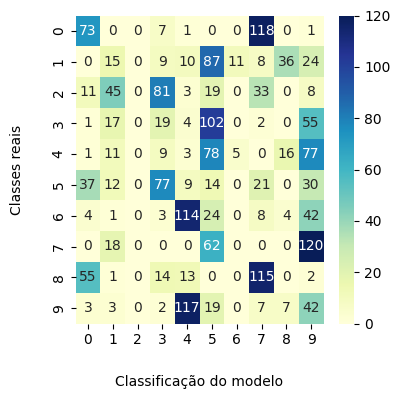

***********************
Épocas:  32
Função de custo:  1785.0497491271253
----------------
Parâmetros de Largura s:  [[0.0211498  0.02135702 0.02139227 0.02138621 0.0215102  0.02139234
  0.02147027 0.02109858 0.02118223 0.02091798 0.02089761 0.0213382
  0.02144677 0.0213435  0.02137123 0.02135125 0.02135066 0.02159977
  0.02184775 0.02116619 0.02091306 0.0208833  0.0211936  0.0212962
  0.02135283 0.02132635 0.02142541 0.0216315  0.02175028 0.02090844
  0.02090259 0.02106626 0.02126238 0.0213072  0.0214311  0.02140258
  0.02132076 0.02091967 0.02103765 0.02120668 0.02141781 0.02126588
  0.02139019 0.02103664 0.02110856 0.02122768 0.02144552]
 [0.02122709 0.02137651 0.02140671 0.02140179 0.02148878 0.02135721
  0.0214318  0.02115627 0.02119242 0.0209268  0.0209197  0.02127107
  0.0213774  0.02136901 0.0213934  0.02138367 0.02133067 0.02155826
  0.02182096 0.02118276 0.02093056 0.02093283 0.02118076 0.02122816
  0.02138072 0.02136833 0.02140824 0.02158427 0.02174164 0.02093317
  0.02096008

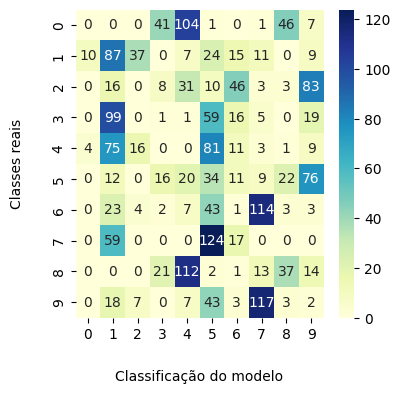

***********************
Épocas:  33
Função de custo:  1798.3960508846462
----------------
Parâmetros de Largura s:  [[0.02116342 0.02134359 0.02137221 0.02137792 0.02149822 0.02139605
  0.02145155 0.02110795 0.02118164 0.02092154 0.02093431 0.0213253
  0.02140935 0.02133232 0.02135375 0.02134619 0.0213394  0.02157777
  0.02184372 0.02116728 0.02091727 0.0209253  0.02121242 0.0212644
  0.02133756 0.02132368 0.02141285 0.02161372 0.02175134 0.02091345
  0.02094235 0.02110693 0.02124478 0.02130641 0.02141977 0.02138557
  0.0213357  0.02095691 0.02108301 0.02121437 0.02140736 0.0212483
  0.02138578 0.02108222 0.02112971 0.02121063 0.02142474]
 [0.02120633 0.02136935 0.02139287 0.02139581 0.02149357 0.0213785
  0.02143741 0.02114243 0.0211933  0.02091954 0.02090593 0.02129094
  0.02139325 0.02136049 0.02137832 0.0213722  0.02134859 0.02156988
  0.02183115 0.02118194 0.02092207 0.02091139 0.0211843  0.02124676
  0.02136485 0.02135405 0.02142283 0.02160451 0.02174669 0.02092332
  0.02093697 0

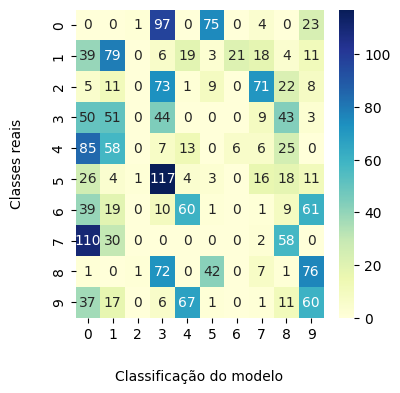

***********************
Épocas:  34
Função de custo:  1784.3226424426962
----------------
Parâmetros de Largura s:  [[0.02137852 0.02128237 0.02123259 0.0213234  0.02131659 0.02102222
  0.0212645  0.02134286 0.02133159 0.02140874 0.02126959 0.02121002
  0.02129325 0.02128463 0.02123047 0.02130515 0.02126284 0.02106984
  0.02090009 0.02133201 0.02141106 0.02128124 0.02133002 0.02130944
  0.0212345  0.02129665 0.02125515 0.02114423 0.02089655 0.02141307
  0.02129062 0.0214215  0.02126919 0.02129566 0.02127901 0.02127885
  0.02141388 0.02129777 0.02143475 0.02114052 0.02129458 0.02132381
  0.02139987 0.02143288 0.02114676 0.0213355  0.0213117 ]
 [0.02107285 0.02111375 0.02110298 0.02116617 0.02138998 0.02136867
  0.02120289 0.02111138 0.02123094 0.02119514 0.02131992 0.02149176
  0.02146691 0.02109494 0.02109073 0.02113536 0.02117717 0.02137702
  0.02140403 0.02120847 0.02115732 0.02130625 0.02144834 0.02133016
  0.02108254 0.02111507 0.02114652 0.02127602 0.02139675 0.02113133
  0.021308

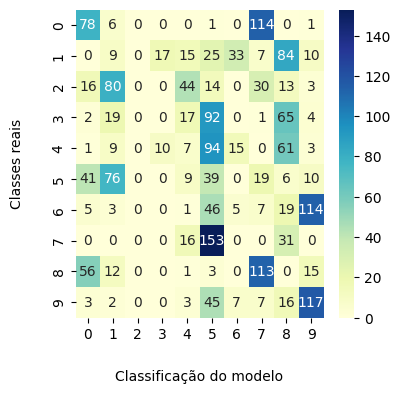

***********************
Épocas:  35
Função de custo:  1802.7526420774418
----------------
Parâmetros de Largura s:  [[0.02094663 0.02107204 0.02109128 0.02116853 0.02144568 0.02138708
  0.02131324 0.02099144 0.02117349 0.02112913 0.0213443  0.02159266
  0.02152162 0.02104712 0.02106439 0.02111328 0.02116843 0.0214527
  0.02159885 0.02114127 0.02107388 0.02128121 0.02145861 0.02137801
  0.02104452 0.02107634 0.02117071 0.02134282 0.02157196 0.02103437
  0.02125368 0.02143786 0.0214514  0.02104993 0.02114643 0.02129349
  0.02151406 0.02123857 0.02145232 0.02155663 0.02112016 0.02122089
  0.02142231 0.02145364 0.02153445 0.02118492 0.02147367]
 [0.0213703  0.02129012 0.02122098 0.02133878 0.02132827 0.02107706
  0.02130641 0.02134873 0.02134152 0.02141899 0.02128839 0.02122376
  0.02128926 0.02129148 0.02121074 0.02130019 0.02126722 0.02113337
  0.0209028  0.02133991 0.02142076 0.02129827 0.021284   0.0213021
  0.02120999 0.02127928 0.02126828 0.0211579  0.02093278 0.0214221
  0.02130289 

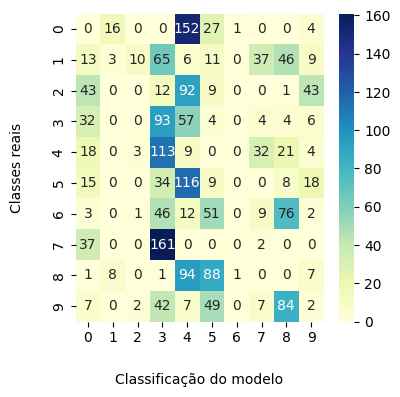

***********************
Épocas:  36
Função de custo:  1785.9930446942526
----------------
Parâmetros de Largura s:  [[0.02138639 0.02140147 0.02116644 0.02137574 0.02134204 0.02125924
  0.02143596 0.02140885 0.02136086 0.02130307 0.02112633 0.02122082
  0.02135986 0.02140656 0.02117553 0.02134784 0.02142043 0.02139938
  0.02106551 0.02136725 0.02132255 0.02118205 0.02111592 0.02134196
  0.02118682 0.02133247 0.02143644 0.02129531 0.02113572 0.02133504
  0.02121906 0.02105024 0.02126592 0.02132541 0.02145566 0.02129001
  0.0211891  0.02124255 0.02105895 0.0211655  0.02147031 0.02125575
  0.02122937 0.02108059 0.02117072 0.02123703 0.02127998]
 [0.02118647 0.02137945 0.02140988 0.02140264 0.02150677 0.02137974
  0.02146063 0.02112668 0.02119195 0.0209165  0.02086973 0.02131057
  0.02143853 0.021368   0.02139223 0.02137395 0.02136091 0.02159539
  0.0218368  0.02117848 0.02091734 0.0208673  0.02116747 0.02128621
  0.02137619 0.02135242 0.02143612 0.02162846 0.02174576 0.02091697
  0.020894

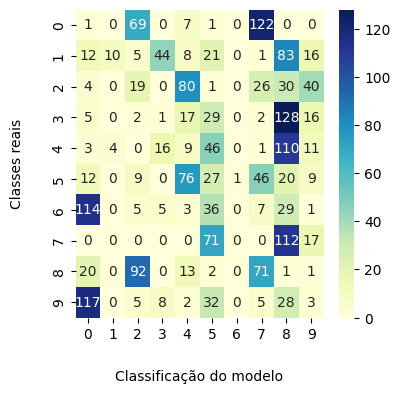

***********************
Épocas:  37
Função de custo:  1785.4855404819812
----------------
Parâmetros de Largura s:  [[0.02107019 0.0211128  0.02110294 0.02116641 0.02139116 0.0213689
  0.02120461 0.02110932 0.02123    0.02119404 0.02132097 0.02149419
  0.02146791 0.02109381 0.02109037 0.02113506 0.02117664 0.02137861
  0.02140805 0.02120734 0.02115591 0.02130631 0.02144833 0.02133061
  0.02108192 0.02111437 0.02114633 0.02127633 0.02140044 0.02112969
  0.02130795 0.02151929 0.02139569 0.02110017 0.02112078 0.02127425
  0.02154003 0.02130925 0.02155163 0.02144769 0.02109884 0.02120932
  0.02142692 0.02155523 0.02141212 0.02117358 0.02144366]
 [0.02138694 0.02140206 0.02116765 0.02137764 0.02134268 0.02125943
  0.02143731 0.021409   0.02136108 0.02130205 0.02112427 0.02122213
  0.02136322 0.02140713 0.0211769  0.02134998 0.02142062 0.02140114
  0.02106825 0.02136745 0.02132155 0.02117981 0.0211147  0.02134421
  0.02118825 0.02133469 0.02143642 0.02129584 0.02113821 0.02133403
  0.0212169

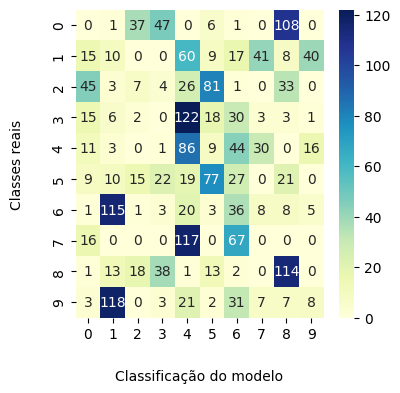

***********************
Épocas:  38
Função de custo:  1785.7002457040367
----------------
Parâmetros de Largura s:  [[0.02122261 0.02139383 0.0214156  0.02140837 0.0214975  0.02136558
  0.02144675 0.02115625 0.02120043 0.02092121 0.02086391 0.02128283
  0.0214215  0.02138476 0.02140176 0.02138703 0.02136428 0.02157976
  0.02182053 0.02118972 0.02092715 0.02087381 0.02115148 0.02126899
  0.02138853 0.02136998 0.02143895 0.02161629 0.02173811 0.02093069
  0.020906   0.02104306 0.02122029 0.02135582 0.02145153 0.02138571
  0.0212607  0.02093041 0.02102842 0.02116918 0.02144386 0.02126481
  0.02134641 0.02103528 0.02108341 0.02123511 0.02141179]
 [0.02112571 0.02132575 0.02136161 0.02136243 0.02150502 0.02139942
  0.02147001 0.02107822 0.02117004 0.02092641 0.0209529  0.02135791
  0.021436   0.02131172 0.02133923 0.02132471 0.02132868 0.02158533
  0.02184773 0.02115267 0.0209159  0.02093141 0.0212302  0.02128941
  0.02132017 0.02129893 0.02140314 0.02161827 0.02174916 0.02090752
  0.020942

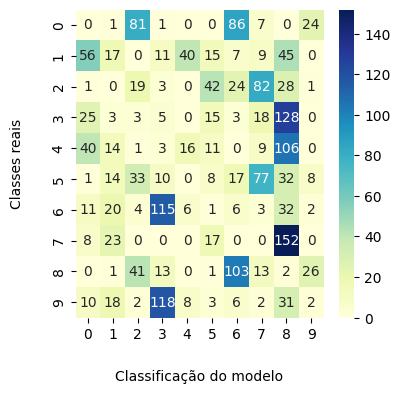

***********************
Épocas:  39
Função de custo:  1784.7123399825118
----------------
Parâmetros de Largura s:  [[0.02138685 0.02140185 0.02116767 0.02137736 0.02134279 0.02126103
  0.02143748 0.02140863 0.02136091 0.02130126 0.02112341 0.02122239
  0.0213635  0.0214069  0.02117689 0.0213497  0.02142125 0.02140295
  0.0210695  0.02136727 0.02132081 0.02117904 0.02111479 0.02134408
  0.02118821 0.02133444 0.02143706 0.02129686 0.02113945 0.02133331
  0.02121629 0.02104684 0.02126747 0.02132738 0.02145605 0.02128851
  0.02118781 0.02123999 0.02105498 0.02116486 0.02147055 0.02125288
  0.02122865 0.02107662 0.02116828 0.0212338  0.02128135]
 [0.02121413 0.02137162 0.02140369 0.02139924 0.02149261 0.02136449
  0.02143817 0.02114507 0.0211892  0.02092431 0.02091886 0.02128244
  0.02138569 0.02136329 0.02138914 0.02137834 0.02133216 0.02156493
  0.02182642 0.02117857 0.02092631 0.02092762 0.02118535 0.02123607
  0.02137555 0.02136139 0.02140987 0.02159198 0.02174389 0.02092754
  0.020953

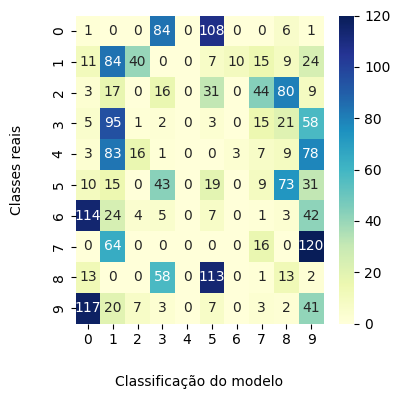

***********************
Épocas:  40
Função de custo:  1784.2661079687866
----------------
Parâmetros de Largura s:  [[0.02122822 0.02138456 0.02141102 0.02140465 0.02149197 0.02136006
  0.02143631 0.0211582  0.02119582 0.02092462 0.02089762 0.02127246
  0.0213919  0.02137664 0.02139774 0.02138599 0.02134419 0.02156552
  0.0218217  0.02118597 0.02092956 0.02091077 0.02116746 0.02124088
  0.02138503 0.02137043 0.02142092 0.02159684 0.02174132 0.02093279
  0.02094037 0.02107778 0.02120124 0.02135714 0.02143615 0.02136672
  0.02127456 0.0209622  0.02106697 0.02117281 0.02142952 0.0212481
  0.02134675 0.02107378 0.02109954 0.02122128 0.02139393]
 [0.02138022 0.021293   0.02122351 0.02133422 0.02132173 0.02105981
  0.02128797 0.02134999 0.02134199 0.02141625 0.02127438 0.02121406
  0.02127213 0.02129543 0.02121616 0.02130126 0.02126882 0.02111426
  0.02089681 0.02134168 0.02142006 0.02128613 0.02130857 0.02129788
  0.02121741 0.02128462 0.0212714  0.02114656 0.02091472 0.02142305
  0.0212932

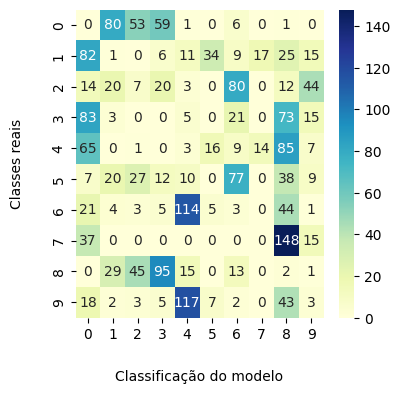

***********************
Épocas:  41
Função de custo:  1789.2402902579101
----------------
Parâmetros de Largura s:  [[0.0210684  0.0211109  0.02109722 0.02116188 0.02138978 0.02136918
  0.02120266 0.02110876 0.02123257 0.02119985 0.02132264 0.02149219
  0.02147215 0.0210916  0.02108462 0.02113045 0.02117887 0.02137629
  0.02140048 0.02120957 0.02116144 0.02130853 0.02144707 0.02133458
  0.02107627 0.02110968 0.02114753 0.02127856 0.02139279 0.02113491
  0.02131043 0.02152066 0.0213977  0.02109547 0.02112135 0.02127891
  0.02154232 0.02131182 0.02155341 0.02144439 0.02109911 0.02121368
  0.02142931 0.02155685 0.02140968 0.02117723 0.02144627]
 [0.02112919 0.02131863 0.02135305 0.02135908 0.02150671 0.02139863
  0.0214682  0.02107903 0.02116635 0.02093074 0.02096737 0.02135512
  0.02142664 0.02130505 0.02133106 0.02132183 0.02132047 0.02158003
  0.0218501  0.02114943 0.02092    0.02094791 0.02123782 0.02128201
  0.02131248 0.02129663 0.02139652 0.02161089 0.02175126 0.02091165
  0.020958

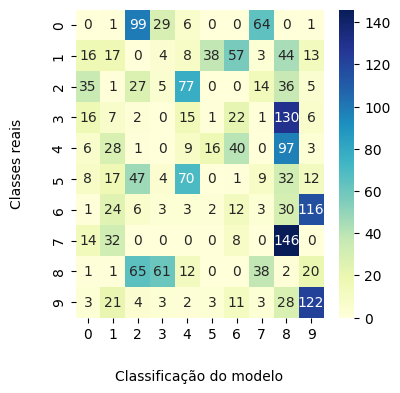

***********************
Épocas:  42
Função de custo:  1788.1118420333478
----------------
Parâmetros de Largura s:  [[0.02138616 0.0214035  0.02116503 0.02137734 0.02134278 0.02125538
  0.02143852 0.02141058 0.02136265 0.02130581 0.02112674 0.02122176
  0.02136402 0.02140859 0.02117366 0.02134846 0.02142025 0.02139703
  0.0210634  0.02136897 0.02132516 0.02118214 0.02111443 0.02134581
  0.02118473 0.02133232 0.02143611 0.02129325 0.02113446 0.02133751
  0.02121897 0.02104643 0.02127095 0.02132477 0.02145587 0.02128868
  0.02118738 0.02124243 0.02105489 0.02116802 0.02147103 0.0212554
  0.02122636 0.0210769  0.02117166 0.02123712 0.02127659]
 [0.02138641 0.021402   0.02116223 0.02137605 0.02134009 0.02124431
  0.02143543 0.02141307 0.02136435 0.02131677 0.02113986 0.02121855
  0.02135698 0.02140727 0.02117017 0.02134639 0.02141499 0.02138463
  0.02104422 0.02137085 0.02133555 0.02119511 0.02111777 0.02134466
  0.02118102 0.02132961 0.02143067 0.02128198 0.02111575 0.02134755
  0.0212308

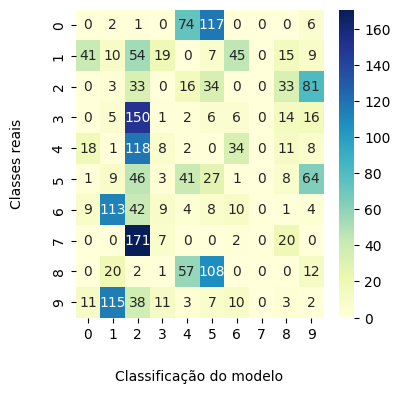

***********************
Épocas:  43
Função de custo:  1784.1011644011019
----------------
Parâmetros de Largura s:  [[0.02138745 0.02140155 0.02116911 0.02137829 0.02134249 0.02126085
  0.02143733 0.02140836 0.02136072 0.02130106 0.02112314 0.02122249
  0.02136382 0.02140662 0.02117844 0.02135102 0.02142085 0.02140337
  0.02107024 0.02136711 0.02132059 0.02117874 0.02111464 0.02134431
  0.0211898  0.02133595 0.02143657 0.02129632 0.02113972 0.02133308
  0.02121603 0.02104651 0.0212673  0.02132896 0.02145555 0.02128733
  0.02118828 0.02123975 0.02105443 0.02116394 0.02147005 0.02125135
  0.02122924 0.02107597 0.02116712 0.02123221 0.02128197]
 [0.02137654 0.02129642 0.02121668 0.02133772 0.0213229  0.02106955
  0.02130426 0.02135171 0.02134286 0.02141935 0.02128662 0.02121639
  0.02127926 0.02129875 0.02120805 0.02130117 0.02127039 0.0211297
  0.0208972  0.02134244 0.02142271 0.02129931 0.02129102 0.02129853
  0.0212086  0.02128179 0.02127528 0.02115249 0.02092621 0.02142512
  0.0213051

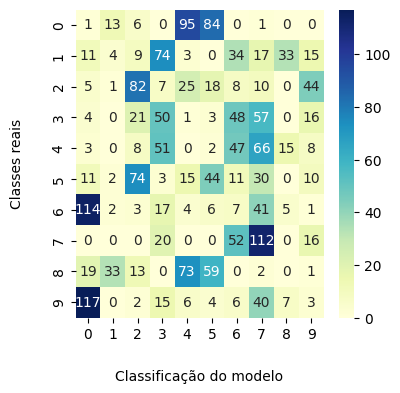

***********************
Épocas:  44
Função de custo:  1784.3973136472973
----------------
Parâmetros de Largura s:  [[0.02115893 0.02136051 0.02139536 0.02138939 0.02150909 0.0213891
  0.02146702 0.02110494 0.02118343 0.02091762 0.02089589 0.02133067
  0.02144058 0.02134765 0.02137519 0.02135622 0.02134998 0.02159703
  0.02184603 0.0211681  0.02091383 0.02088491 0.02119011 0.02128959
  0.02135741 0.0213323  0.02142538 0.02162869 0.02175021 0.02091011
  0.02090557 0.02106675 0.0212549  0.02131374 0.02143224 0.02139923
  0.02131581 0.02092331 0.02104016 0.02120129 0.0214197  0.02126399
  0.02138575 0.02104007 0.02110526 0.0212269  0.02144005]
 [0.02138668 0.02140204 0.02116785 0.02137729 0.02134327 0.02126266
  0.02143796 0.02140821 0.02136066 0.02129963 0.02112165 0.02122298
  0.02136441 0.02140704 0.02117715 0.0213497  0.02142201 0.02140476
  0.02107197 0.02136699 0.02131925 0.02117726 0.02111455 0.02134417
  0.02118849 0.02133452 0.02143784 0.02129857 0.02114183 0.02133181
  0.0212146

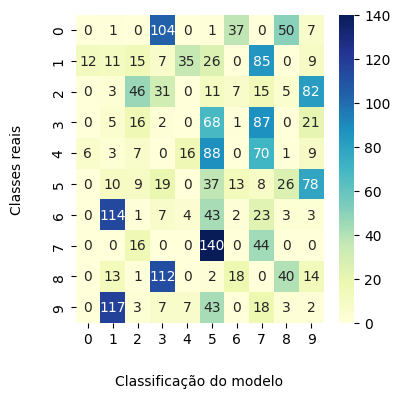

***********************
Épocas:  45
Função de custo:  1785.7519341790644
----------------
Parâmetros de Largura s:  [[0.02111079 0.021311   0.02134717 0.02135111 0.02150424 0.02140203
  0.0214718  0.02106713 0.02116456 0.02093049 0.0209761  0.0213701
  0.02143727 0.02129629 0.02132369 0.02131108 0.02131986 0.02158133
  0.02184769 0.02114622 0.02091711 0.02094989 0.02124603 0.02129244
  0.02130397 0.02128428 0.02139406 0.02161371 0.02174855 0.02090675
  0.02095669 0.02112928 0.02127915 0.02126422 0.02139678 0.0213928
  0.02137209 0.02096509 0.02109828 0.02125485 0.02138076 0.02125277
  0.02140997 0.02109323 0.02117019 0.02121169 0.02144542]
 [0.02106997 0.02111224 0.02110136 0.02116506 0.0213911  0.02136883
  0.02120427 0.02110873 0.02123023 0.02119467 0.02132052 0.02149413
  0.02146931 0.02109324 0.02108888 0.02113388 0.02117763 0.02137821
  0.02140661 0.02120748 0.02115643 0.0213059  0.02144792 0.0213318
  0.02108051 0.02111328 0.02114696 0.02127746 0.02139895 0.02113013
  0.02130764 

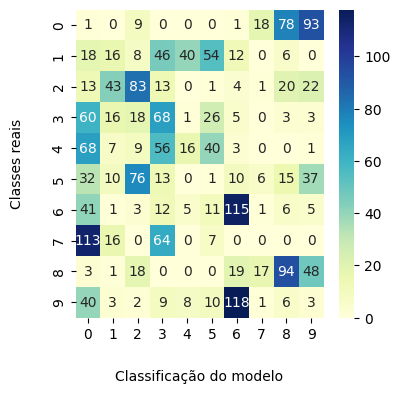

***********************
Épocas:  46
Função de custo:  1785.487800815672
----------------
Parâmetros de Largura s:  [[0.02138152 0.021289   0.0212305  0.02133163 0.0213193  0.02104211
  0.02127485 0.02134755 0.0213382  0.02141249 0.02126728 0.021211
  0.02127558 0.02129145 0.02122529 0.02130478 0.02126615 0.0210932
  0.02089728 0.02133824 0.02141608 0.02127865 0.02132155 0.02130128
  0.02122765 0.02129169 0.02126471 0.02114367 0.02090392 0.02141903
  0.02128693 0.02140464 0.02127054 0.02128854 0.02129235 0.02128385
  0.02138926 0.02129333 0.021417   0.02114878 0.02130995 0.02133128
  0.02138023 0.02141598 0.02114983 0.02134418 0.02128772]
 [0.02117539 0.02134812 0.02138554 0.02138463 0.02149975 0.02137901
  0.02145208 0.02111373 0.02117774 0.02092362 0.02094155 0.0213144
  0.02139985 0.02133759 0.0213675  0.02135632 0.02132268 0.02157364
  0.02183849 0.02116435 0.02091951 0.02093764 0.0212108  0.02125161
  0.02135147 0.0213353  0.02140099 0.0215993  0.02174908 0.02091624
  0.02095596 0.

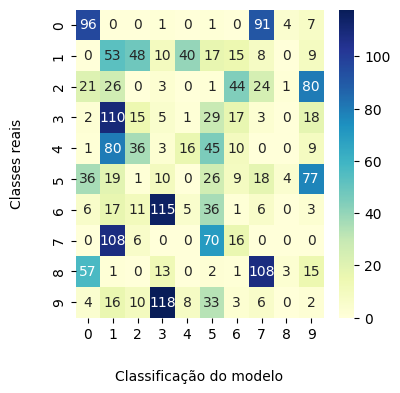

***********************
Épocas:  47
Função de custo:  1786.175473276266
----------------
Parâmetros de Largura s:  [[0.02137274 0.02128727 0.02122774 0.02133589 0.02132092 0.0210408
  0.02129119 0.02134505 0.021333   0.02141658 0.02129301 0.02121433
  0.02129633 0.02128907 0.02122112 0.02130802 0.02126354 0.02109497
  0.02089723 0.02133292 0.021418   0.02130375 0.02130347 0.02130546
  0.02122247 0.02129294 0.02126127 0.02115068 0.02091445 0.02141896
  0.02130925 0.02137862 0.02127842 0.02128796 0.02129085 0.02128171
  0.02137757 0.02131308 0.02139035 0.02114451 0.0213104  0.02132796
  0.02136754 0.02139036 0.02116078 0.02134018 0.02127727]
 [0.02119217 0.02135289 0.02138995 0.02138889 0.02149355 0.02137157
  0.02144289 0.02112625 0.02118054 0.02092522 0.02094607 0.02130061
  0.02138436 0.02134372 0.02137365 0.02136429 0.02131863 0.02156447
  0.02183044 0.02116857 0.02092304 0.0209476  0.02120924 0.02123694
  0.02135887 0.02134529 0.02139685 0.02158785 0.02174527 0.02092135
  0.02096754

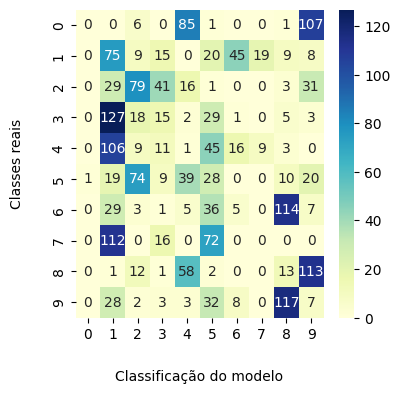

***********************
Épocas:  48
Função de custo:  1788.2012542770651
----------------
Parâmetros de Largura s:  [[0.02123025 0.02136456 0.02138917 0.02137853 0.02145815 0.02137264
  0.02142259 0.02114505 0.02118717 0.02093029 0.0209619  0.0212907
  0.0213454  0.02135981 0.02137919 0.02136744 0.02133163 0.02152169
  0.02178408 0.02117871 0.02093057 0.02096469 0.02121509 0.02120911
  0.02136902 0.02135674 0.02140024 0.02155657 0.02171106 0.02093113
  0.02098375 0.02113428 0.02120552 0.02134641 0.02141006 0.02135215
  0.02132638 0.02099871 0.02111999 0.02121528 0.02140102 0.02123753
  0.02136454 0.02112298 0.0211511  0.02121047 0.02137664]
 [0.02127756 0.02142586 0.02138927 0.0213948  0.02143873 0.02137191
  0.02144445 0.02121681 0.02124502 0.0209653  0.0208272  0.02127719
  0.02145254 0.02142066 0.0213852  0.02138054 0.02143416 0.02154645
  0.02168142 0.02123928 0.02098415 0.02084226 0.02111443 0.02132424
  0.0213795  0.0213704  0.02148618 0.02158953 0.02162854 0.02099562
  0.0208826

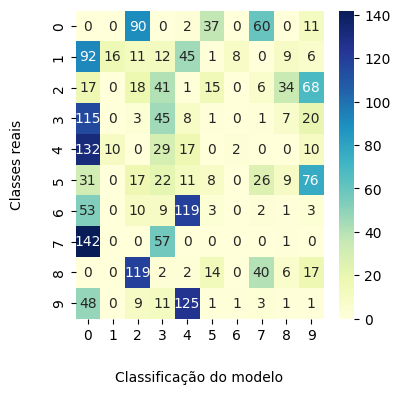

***********************
Épocas:  49
Função de custo:  1784.2695535140815
----------------
Parâmetros de Largura s:  [[0.02138669 0.02140192 0.02116785 0.0213772  0.02134321 0.02126233
  0.02143781 0.02140824 0.02136064 0.02129987 0.0211221  0.02122287
  0.02136401 0.02140692 0.02117717 0.02134966 0.02142179 0.02140432
  0.02107132 0.02136698 0.02131948 0.02117771 0.02111469 0.02134397
  0.02118853 0.02133451 0.02143758 0.02129819 0.02114114 0.02133203
  0.02121505 0.0210464  0.02126718 0.02132751 0.02145641 0.02128897
  0.02118753 0.02123883 0.02105453 0.02116463 0.02147077 0.02125283
  0.02122887 0.02107617 0.02116778 0.02123355 0.02128233]
 [0.02138658 0.0214022  0.02116853 0.02137744 0.0213438  0.02126459
  0.02143843 0.02140762 0.02136022 0.02129749 0.02111925 0.02122355
  0.02136551 0.02140716 0.02117798 0.02135005 0.0214228  0.02140686
  0.02107563 0.02136651 0.02131722 0.02117487 0.02111405 0.02134421
  0.02118938 0.02133503 0.02143865 0.02130074 0.02114524 0.02132984
  0.021212

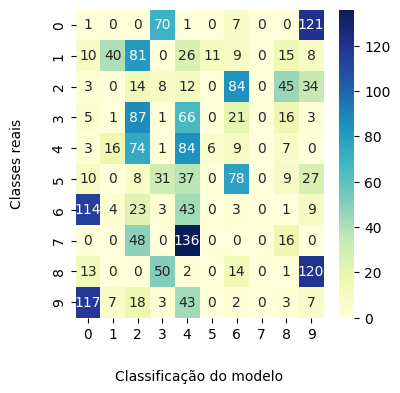

In [15]:
num_epocas = 1
algo = KFCM_K_W2(X)

best_custo = 100000
best_g = None
best_s = None

for num_epocas in range(50):
  print("***********************")
  print("Épocas: ", num_epocas)
  algo.fit()
  S = algo.compute_widths()
  g = algo.compute_prototypes()
  U = algo.update_membership()
  J_custo = algo.compute_JNew()
  if J_custo <= best_custo:
    best_custo = J_custo
    best_g = g
    best_s = S

  print("Função de custo: ", J_custo)
  print("----------------")
  print("Parâmetros de Largura s: ", S)
  print("----------------")
  print("Protótipos de cada grupo g:", g)
  print("----------------")
  print("Matriz U: ", U)

  #Partição Crisp
  x = np.array(range(0, 2000))
  pred_label=[]
  for i in range(2000):
    indice_max = np.argmax(U[:,i])
    pred_label.append(indice_max)

  label_1d = label.to_numpy().ravel()

  #ARI considerando a partição CRISP
  print("Predict labels:",pred_label)
  print("True labels:",np.transpose(label.to_numpy()))
  respred_label= np.reshape(pred_label, (2000,1)).ravel()
  ari=ARI(label.to_numpy().ravel(),respred_label)
  print("ARI:",ari)

  #Calcular partition coefficient
  cluster=10
  partition_coefficient = 0
  for i in range(cluster):
    for j in range(len(X)):
      partition_coefficient += U[i,j]**2
  partition_coefficient /= len(X)
  print("Fuzzy Partition Coefficient:", partition_coefficient)
  partition_coefficient = np.sum(U ** 2) / len(X)

  #Modified partition Coefficient
  MPC = 1 - ((cluster / (cluster - 1)) * (1 - partition_coefficient))

  print("Modified partition Coefficient:", MPC)

  true_labels = label.to_numpy().ravel()
  pred_labels = [int(i) for i in pred_label]
  conf_matrix = confusion_matrix(true_labels, pred_labels)

  #Plotar a matriz de confusão
  plt.figure(figsize=(4, 4))
  ax = sns.heatmap(
      conf_matrix,
      annot=True,
      fmt='d',
      cbar=True,
      cmap='YlGnBu'
  )
  ax.set_xlabel("Classificação do modelo", labelpad=20)
  ax.set_ylabel("Classes reais", labelpad=20)
  plt.show()

  #incrementa o número de épocas
  num_epocas += 1

In [16]:
    print("Parâmetros de Largura s: ")
    matriz_s = best_s
    pd.set_option('display.max_columns', 220)
    df_s = pd.DataFrame(matriz_s)
    df_s.style.highlight_max(axis=0, color='green')
    df_s

Parâmetros de Largura s: 


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46
0,0.021067,0.021111,0.021101,0.021165,0.021392,0.021370,0.021206,0.021107,0.021229,0.021194,0.021322,0.021496,0.021469,0.021092,0.021088,0.021134,0.021177,0.021380,0.021411,0.021206,0.021155,0.021307,0.021449,0.021332,0.021080,0.021113,0.021147,0.021278,0.021403,0.021128,0.021308,0.021519,0.021396,0.021098,0.021121,0.021275,0.021541,0.021309,0.021551,0.021449,0.021099,0.021209,0.021427,0.021555,0.021414,0.021174,0.021444
1,0.021193,0.021367,0.021401,0.021396,0.021500,0.021375,0.021450,0.021129,0.021186,0.020921,0.020910,0.021300,0.021406,0.021357,0.021384,0.021370,0.021338,0.021578,0.021836,0.021174,0.020920,0.020912,0.021187,0.021255,0.021369,0.021351,0.021416,0.021607,0.021748,0.020920,0.020935,0.021086,0.021222,0.021335,0.021428,0.021377,0.021304,0.020954,0.021069,0.021188,0.021418,0.021249,0.021369,0.021072,0.021107,0.021218,0.021412
2,0.021380,0.021297,0.021217,0.021335,0.021323,0.021073,0.021298,0.021352,0.021345,0.021419,0.021278,0.021216,0.021271,0.021299,0.021208,0.021298,0.021272,0.021131,0.020897,0.021345,0.021423,0.021291,0.021298,0.021296,0.021209,0.021279,0.021277,0.021149,0.020923,0.021426,0.021298,0.021366,0.021279,0.021273,0.021310,0.021291,0.021349,0.021302,0.021378,0.021162,0.021330,0.021339,0.021346,0.021379,0.021167,0.021352,0.021253
3,0.021376,0.021294,0.021219,0.021338,0.021323,0.021064,0.021302,0.021350,0.021341,0.021419,0.021288,0.021216,0.021282,0.021297,0.021211,0.021303,0.021269,0.021123,0.020897,0.021340,0.021422,0.021300,0.021294,0.021300,0.021212,0.021284,0.021272,0.021152,0.020924,0.021424,0.021306,0.021361,0.021281,0.021278,0.021305,0.021289,0.021352,0.021310,0.021373,0.021156,0.021326,0.021336,0.021347,0.021374,0.021168,0.021349,0.021255
4,0.021387,0.021402,0.021169,0.021378,0.021343,0.021261,0.021437,0.021408,0.021361,0.021301,0.021123,0.021223,0.021364,0.021407,0.021178,0.021350,0.021421,0.021404,0.021070,0.021367,0.021320,0.021179,0.021115,0.021344,0.021189,0.021335,0.021437,0.021297,0.021140,0.021333,0.021216,0.021047,0.021267,0.021328,0.021456,0.021288,0.021188,0.021240,0.021054,0.021164,0.021470,0.021252,0.021229,0.021076,0.021167,0.021233,0.021282
5,0.021380,0.021283,0.021233,0.021323,0.021316,0.021021,0.021262,0.021343,0.021332,0.021408,0.021266,0.021209,0.021291,0.021285,0.021231,0.021305,0.021263,0.021069,0.020901,0.021333,0.021411,0.021277,0.021333,0.021310,0.021235,0.021297,0.021255,0.021144,0.020895,0.021413,0.021287,0.021426,0.021268,0.021296,0.021279,0.021279,0.021416,0.021295,0.021439,0.021141,0.021294,0.021324,0.021402,0.021437,0.021145,0.021336,0.021314
6,0.021068,0.021112,0.021102,0.021166,0.021391,0.021370,0.021205,0.021108,0.021230,0.021194,0.021322,0.021495,0.021468,0.021093,0.021089,0.021134,0.021177,0.021379,0.021409,0.021207,0.021156,0.021307,0.021449,0.021331,0.021080,0.021113,0.021147,0.021278,0.021401,0.021129,0.021308,0.021520,0.021396,0.021099,0.021121,0.021275,0.021541,0.021309,0.021552,0.021448,0.021099,0.021209,0.021427,0.021556,0.021413,0.021174,0.021444
7,0.021387,0.021402,0.021169,0.021378,0.021343,0.021263,0.021438,0.021408,0.021361,0.021300,0.021122,0.021223,0.021365,0.021407,0.021178,0.021351,0.021422,0.021405,0.021072,0.021367,0.021319,0.021177,0.021114,0.021344,0.021190,0.021336,0.021437,0.021298,0.021142,0.021332,0.021215,0.021046,0.021267,0.021329,0.021456,0.021288,0.021188,0.021238,0.021053,0.021164,0.021471,0.021251,0.021229,0.021075,0.021167,0.021232,0.021283
8,0.021215,0.021382,0.021410,0.021404,0.021497,0.021367,0.021444,0.021148,0.021194,0.020922,0.020890,0.021284,0.021405,0.021373,0.021396,0.021382,0.021348,0.021575,0.021828,0.021183,0.020925,0.020899,0.021168,0.021253,0.021382,0.021365,0.021425,0.021607,0.021744,0.020927,0.020928,0.021070,0.021212,0.021350,0.021439,0.021376,0.021281,0.020949,0.021055,0.021175,0.021431,0.021253,0.021355,0.021061,0.021095,0.021224,0.021405
9,0.021091,0.021305,0.021339,0.021341,0.021

QStandardPaths: XDG_RUNTIME_DIR not set, defaulting to '/tmp/runtime-root'
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


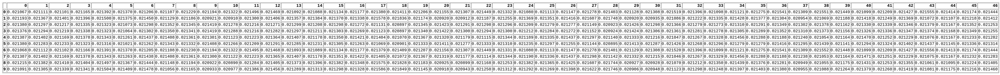

In [17]:
#Matriz S
html_table = df_s.to_html()
with open('output.html', 'w') as f:
  f.write(html_table)
  options = {
          'format': 'png',
          'width': '1000',
          'encoding': 'utf-8'
      }
imgkit.from_file('output.html', 'output.png', options=options)
Image('output.png')

In [19]:
    print("Protótipos de cada grupo g:")
    matriz_g = best_g
    pd.set_option('display.max_columns', 220)
    df_g = pd.DataFrame(matriz_g)
    df_g.style.highlight_max(axis=0, color='green')
    df_g

Protótipos de cada grupo g:


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46
0,-0.612279,-0.627302,-0.846131,-0.598934,-0.399291,0.176448,-0.519149,-0.527993,-0.363203,-0.129570,0.274463,0.515609,0.050163,-0.633989,-0.858139,-0.669262,-0.436370,-0.036293,-0.103414,-0.396437,-0.196829,0.118723,0.287603,0.078716,-0.859813,-0.705498,-0.415890,-0.389370,-0.109361,-0.242359,0.003097,0.057268,0.067588,-0.723105,-0.407776,-0.642696,0.230806,-0.075299,-0.063867,0.382420,-0.402480,-0.723091,0.371903,-0.115792,0.460918,-0.745023,0.166016
1,-0.530114,-0.358741,-0.354981,-0.192482,-0.046825,0.969200,0.171296,-0.599696,-0.618351,-0.672418,-0.849330,-0.717469,-0.466787,-0.370461,-0.404927,-0.346529,-0.616712,0.543049,0.638239,-0.621039,-0.666436,-0.826709,-0.768396,-0.675393,-0.436171,-0.423602,-0.536072,-0.569552,0.789105,-0.659580,-0.806138,-0.646189,-0.765303,-0.463645,-0.413302,-0.215413,-0.273795,-0.790342,-0.573410,-0.905240,-0.334668,-0.054155,0.132116,-0.545892,-0.909270,-0.005732,0.536607
2,0.239246,0.204312,0.262435,0.245083,0.156093,-0.517707,-0.094355,0.406897,0.395462,0.462652,0.523156,0.292729,0.308414,0.204002,0.275502,0.283901,0.352869,-0.333819,-0.260650,0.395544,0.456448,0.544501,0.334563,0.446486,0.281767,0.297373,0.251183,0.189592,-0.344130,0.449374,0.548532,0.338451,0.463245,0.300960,0.156916,0.027712,0.060655,0.546326,0.343750,0.530110,0.099925,-0.051070,-0.126505,0.348828,0.535156,-0.073347,-0.327761
3,0.216248,0.195453,0.229027,0.184721,0.141921,-0.528206,-0.091617,0.376985,0.399575,0.457970,0.494075,0.297254,0.340352,0.194253,0.242079,0.227374,0.371879,-0.359935,-0.271416,0.397216,0.450425,0.509577,0.314112,0.472720,0.248586,0.244643,0.282062,0.222216,-0.348481,0.442558,0.511839,0.302606,0.478483,0.251124,0.191482,0.075730,0.046484,0.509240,0.303208,0.515102,0.135048,-0.007340,-0.134650,0.306789,0.502743,-0.034611,-0.335050
4,0.313254,0.520723,0.780450,0.381187,0.163882,0.039590,0.505733,0.160207,0.178505,-0.116574,-0.520848,-0.232476,0.112753,0.517826,0.761039,0.449062,0.300855,0.272585,-0.243656,0.193178,-0.068003,-0.490907,-0.246432,-0.123116,0.740851,0.477402,0.370021,0.561362,-0.121718,-0.034761,-0.436151,-0.226035,-0.131878,0.488087,0.403642,0.756150,-0.418975,-0.388389,-0.215323,-0.331985,0.419677,0.834829,-0.459031,-0.212520,-0.450411,0.852363,-0.243875
5,0.094276,0.037243,-0.071160,-0.083499,-0.010115,-0.634057,-0.195996,0.271029,0.384549,0.521063,0.678693,0.416918,0.306534,0.037616,-0.047004,-0.041534,0.277930,-0.451235,-0.294001,0.371693,0.492213,0.666033,0.457130,0.453307,-0.030756,-0.018180,0.207166,0.261292,-0.384866,0.469398,0.642261,0.408643,0.483701,-0.004984,0.121202,0.040496,0.218933,0.620054,0.383145,0.542210,0.066069,-0.100832,0.046147,0.374413,0.530801,-0.154874,-0.226937
6,-0.611552,-0.626565,-0.845517,-0.598611,-0.399370,0.174180,-0.519398,-0.526970,-0.361835,-0.127887,0.277040,0.517235,0.050457,-0.633260,-0.857470,-0.668772,-0.435406,-0.037307,-0.104736,-0.395100,-0.195241,0.121219,0.289715,0.079286,-0.859114,-0.704941,-0.415196,-0.388262,-0.110849,-0.240846,0.005490,0.059238,0.068621,-0.722521,-0.407388,-0.642499,0.232276,-0.072996,-0.062024,0.384126,-0.402270,-0.723324,0.372304,-0.114001,0.462746,-0.745390,0.165486
7,0.310947,0.520069,0.779657,0.380219,0.162447,0.042940,0.505406,0.157495,0.176109,-0.119040,-0.523430,-0.234109,0.112250,0.517079,0.759993,0.447569,0.298347,0.275384,-0.243422,0.190746,-0.070508,-0.493673,-0.248240,-0.124996,0.739633,0.475625,0.368029,0.560334,-0.120070,-0.037287,-0.438983,-0.227907,-0.134103,0.486150,0.402096,0.755635,-0.419988,-0.391243,-0.217245,-0.334513,0.418407,0.834767,-0.458806,-0.214476,-0.453192,0.852465,-0.242495
8,-0.496502,-0.306380,-0.268888,-0.118138,-0.014637,0.990218,0.185548,-0.576563,-0.595555,-0.661414,-0.851242,-0.726273,-0.457817,-0.318812,-0.321535,-0.273272,-0.604613,0.605171,0.614314,-0.597447,-0.654288,-0.827725,-0.776502,-0.677541,-0.355549,-0.353675,-0.537457,-0.576635,0.785145,-

QStandardPaths: XDG_RUNTIME_DIR not set, defaulting to '/tmp/runtime-root'
Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


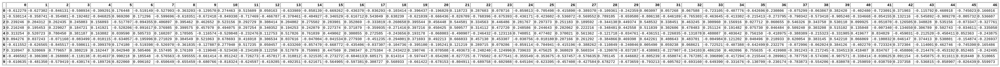

In [20]:
#Matriz G
html_table = df_g.to_html()
with open('output.html', 'w') as f:
  f.write(html_table)
  options = {
          'format': 'png',
          'width': '1000',
          'encoding': 'utf-8'
      }
imgkit.from_file('output.html', 'output.png', options=options)
Image('output.png')

In [ ]:
    print("Matriz U: ")
    matriz_u = U
    pd.set_option('display.max_columns', 220)
    df_u = pd.DataFrame(matriz_u)
    df_u.style.highlight_max(axis=0, color='green')
    df_u